In [6]:
import ipdb
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.pylab as pylab
import cartopy
import cartopy.crs as ccrs
from utils import constants as cnst
from eod import msg
from utils import u_darrays as uda
import datetime
# import salem
# from salem import get_demo_file, DataLevels, GoogleVisibleMap, Map
import shapely.geometry as shpg
import glob
import pickle as pkl
import os
from scipy.stats import binned_statistic_2d
from scipy import stats
from endgame import hist2d



pylab.rcParams['figure.figsize'] = (10., 5.)
%matplotlib inline

In [5]:
cd ..

/home/ck/pythonWorkspace


In [7]:
MREGIONS = {
 'GPlains' : [[-100,-90,32,47], 'nam', -6, (1,7), (5,9), (1,12)], # # 18  
 'china' : [[105,115,25,40], 'asia', 8 , (1,7), (5,9), (1,12)], # 4
 'india' : [[70,90, 5,30], 'asia', 5, (1,7), (5,9), (1,12)], # 7
 'WAf' : [[-18,25,4,25], 'spac', 0, (1,7), (5,9), (1,12)], # last is hourly offset to UCT # 12    # [-18,25,4,25]
 'australia' : [[120,140,-23, -11], 'asia', 9, (11,3), (11,3), (1,12)], # 3
 'SAf' : [[20,35, -35,-15], 'spac', 2, (9,12), (11,3), (11,3)], # 10
 'sub_SA' : [[-68,-47, -40, -20.5], 'spac', -4, (11,3), (11,3), (1,12)] , # 16
# 'trop_SA' : [[-75, -50, -20, -5], 'spac', -5, (1,12), (1,12), (1,12)], # 17


}

In [8]:
rdics = {}
for regs in MREGIONS.keys():
    for ids, y in enumerate(range(2000,2021)):
        #'ipdb.set_trace()
        try:
            test = pd.read_csv(glob.glob('/media/ck/LStorage/global_water/ERA5_MCS_saveFiles/trackv2/'+regs+'_ERA5_10LT_2000-2019_MCSTRACK_localBulk*_'+str(y)+'*_FullYear.csv')[0])
        except:
            ipdb.set_trace()
#         test = pd.read_csv(glob.glob('/media/ck/LStorage/global_water/save_files_v2/'+regs+'_mcs_tracks_final_'+str(y)+'*.csv')[0])
        if ids == 0:
            test2 = pd.DataFrame(test)
        else :
            test2 = pd.concat([test2, test])
    rdics[regs] = test2

In [9]:
(rdics['WAf']['direction']).min()

0.0

In [10]:
print(list(rdics['WAf'].keys()))

['direction', 'tminlon', 'tminlat', 'tmin_calc', 'tmin', 'tmean_core', 'tmean_ccs', 'tcwv', 'tgrad2m', 'tgrad925', 'smgrad', 'efgrad', 'shgrad', 'lhgrad', 'pmax', 'pmean', 'ptot', 'q925', 'q650', 'q850', 'era_precip', 'sm', 'ef', 'u925', 'u650', 'v925', 'v650', 'w925', 'w650', 'rh925', 'rh650', 't925', 't650', 'div925', 'div850', 'div650', 'pv925', 'pv650', 'ushear925_650', 'ushear850_650', 'ushear925_850', 'ushear100m_650', 'vshear925_650', 'vshear850_650', 'vshear925_850', 'vshear100m_650', 'shear925_650', 'shear850_650', 'shear925_850', 'shear100m_650', 'cape', 't2m', 'track_duration', 'start_status', 'end_status', 'start_basetime', 'end_basetime', 'start_split_cloudnumber', 'end_merge_cloudnumber', 'base_time', 'meanlat', 'meanlon', 'area', 'cloudnumber', 'track_status', 'track_interruptions', 'core_area', 'cold_area', 'corecold_mintb', 'corecold_meantb', 'core_meantb', 'mcs_duration', 'mcs_status', 'ccs_area', 'pf_npf', 'pf_lon1', 'pf_lon2', 'pf_lon3', 'pf_lat1', 'pf_lat2', 'pf_la

In [24]:
for ids, regs in enumerate(MREGIONS.keys()):
    
    months = MREGIONS[regs][4]
    dat = rdics[regs]

#     if ids>=4: 
#         posi = (dat['era_precip'] < 0.1) # & (((dat['direction']>=180) & (dat['ushear100m_650']>0)) | ((dat['direction']<=180) & (dat['ushear100m_650']<0)))# & ((dat['utc_month']>=months[0]) | (dat['utc_month']<=months[1]))
#     else:
#         posi = (dat['era_precip'] < 0.1)# & (((dat['direction']>=180) & (dat['ushear100m_650']>0)) | ((dat['direction']<=180) & (dat['ushear100m_650']<0)))#  & ((dat['utc_month']>=months[0]) & (dat['utc_month']<=months[1])) 
#     if ids>=4: 
#         posi = (dat['era_precip'] < 0.1)  & ((dat['utc_month']>=months[0]) | (dat['utc_month']<=months[1]))
#     else:
#         posi = (dat['era_precip'] < 0.1)  & ((dat['utc_month']>=months[0]) & (dat['utc_month']<=months[1])) 
        
#     dat = dat[posi]
        
#     if ids in [0,1,5,6]: 
#         posi = (dat['era_precip'] < 0.1)  & ((dat['direction']>=180) & (dat['ushear925_650'] >= 0))
#     else:
#         posi = (dat['era_precip'] < 0.1) & ((dat['direction']<=180) & (dat['ushear925_650'] <= 0))  
        
#     dat = dat[posi]
    
    if ids>=4: 
        posi = (dat['era_precip'] < 1)  & ((dat['utc_month']>=months[0]) | (dat['utc_month']<=months[1]))
    else:
        posi = (dat['era_precip'] < 1)  & ((dat['utc_month']>=months[0]) & (dat['utc_month']<=months[1])) 

    rdics[regs] = dat[posi]

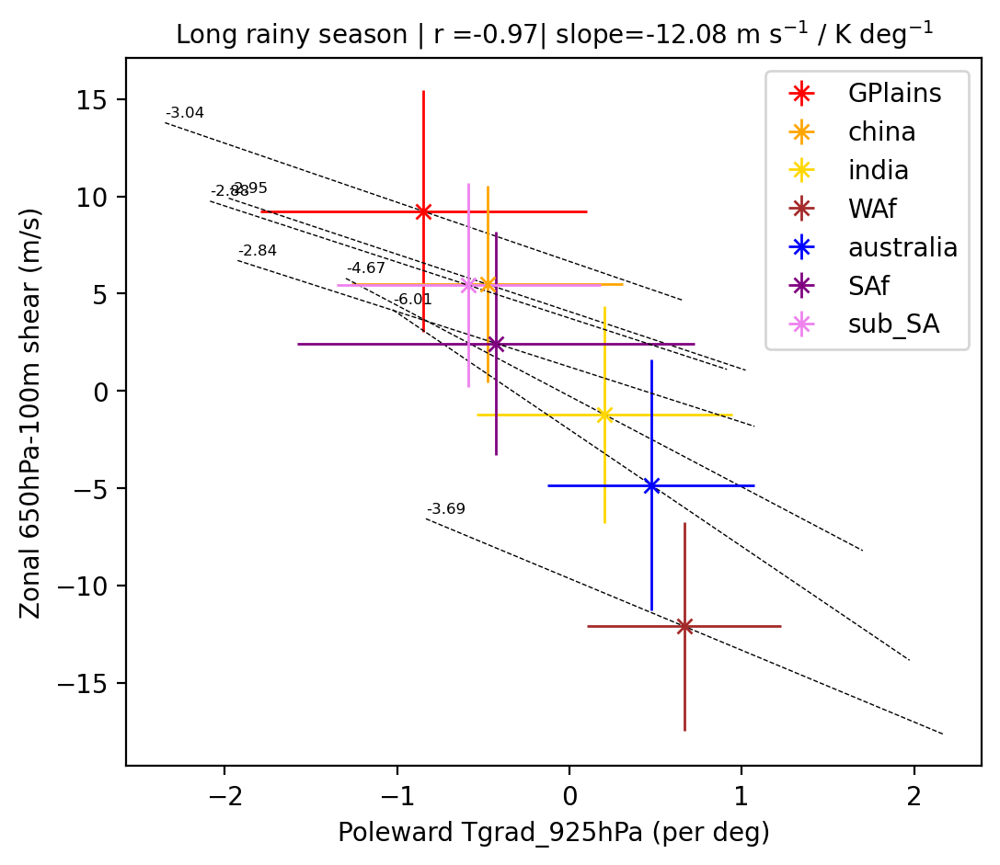

In [12]:
f = plt.figure(figsize=(6,5), dpi=200)
ax = f.add_subplot(111)

colors = ['red', 'orange', 'gold', 'brown', 'blue', 'purple', 'violet']
tgrad_list = []
shear_list = []
for ids, regs in enumerate(MREGIONS.keys()):
    var2 = 'ushear100m_650'
    var1 = 'tgrad925'
    
    dat = rdics[regs]
    
    x = dat[var1]
    y = dat[var2]


    if ids >= 4:
        x = x*-1
        
    #ax.set_ylim(-1.5,1.5)
        
    ax.scatter(np.mean(x), np.mean(y), color=colors[ids], marker='', s=1)
    plt.errorbar(np.mean(x), np.mean(y), yerr=np.std(y), xerr=np.std(x), fmt="x", color=colors[ids], linewidth=1, label=regs)
    pf, intercept, rval, p, std_err = stats.linregress(x, y)
    xer = np.arange(np.mean(x)-1.5,np.mean(x)+2) #np.arange(np.percentile(x,0.4), np.percentile(x,0.6))
    yer = intercept+pf*xer
    plt.plot(xer, yer, color='k', linestyle='dashed', linewidth=0.5)
    plt.text(xer[0], yer[0]+0.3, str(np.round(pf,2)), fontsize=6)
    tgrad_list.append(np.mean(x))
    shear_list.append(np.mean(y))
    ax.set_xlabel('Poleward Tgrad_925hPa (per deg)')
    ax.set_ylabel('Zonal 650hPa-100m shear (m/s)')
pf, intercept, rval, p, std_err = stats.linregress(tgrad_list, shear_list)
plt.title('Long rainy season | r ='+ str(np.round(rval,2))+'| slope='+str(np.round(pf,2))+' m s$^{-1}$ / K deg$^{-1}$', fontsize=10)
plt.legend()
#f.savefig(cnst.FIGS+'/LMCS/ERA5_shear_profiles/scatter_tgrad_shear_regressionCheck.jpg')

/home/ck/miniconda3/lib/python3.10/site-packages/astroML/linear_model/linear_regression_errors.py:10: UserWarning: LinearRegressionwithErrors requires PyMC3 to be installed
  warnings.warn('LinearRegressionwithErrors requires PyMC3 to be installed')
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


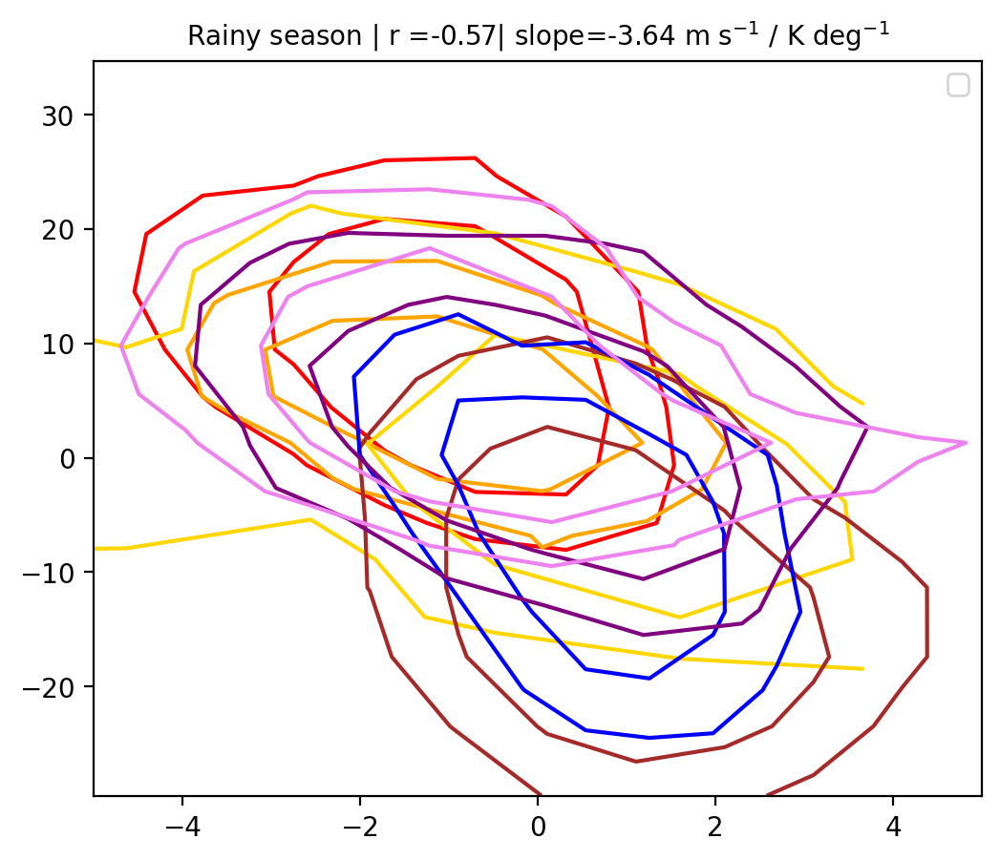

In [13]:
from astroML.plotting import scatter_contour
f = plt.figure(figsize=(6,5), dpi=200)
ax = f.add_subplot(111)

colors = ['red', 'orange', 'gold', 'brown', 'blue', 'purple', 'violet']
tgrad_list = []
shear_list = []
for ids, regs in enumerate(MREGIONS.keys()):
    var2 = 'ushear100m_650'
    var1 = 'tgrad2m'
    
    dat = rdics[regs]
    
    x = dat[var1]
    y = dat[var2]


    if ids >= 4:
        
        x = x*-1
        
    scatter_contour(x,y, threshold=20, levels=3, log_counts=True, ax=ax, histogram2d_args=dict(bins=10),plot_args=dict(marker='+', linestyle='none', color='white',markersize=5),contour_args=dict(colors=colors[ids],),filled_contour=False)
    tgrad_list.extend(x)
    shear_list.extend(y)
    ax.set_xlim(-5,5)
pf, intercept, rval, p, std_err = stats.linregress(tgrad_list, shear_list)
plt.title('Rainy season | r ='+ str(np.round(rval,2))+'| slope='+str(np.round(pf,2))+' m s$^{-1}$ / K deg$^{-1}$', fontsize=10)
plt.legend()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


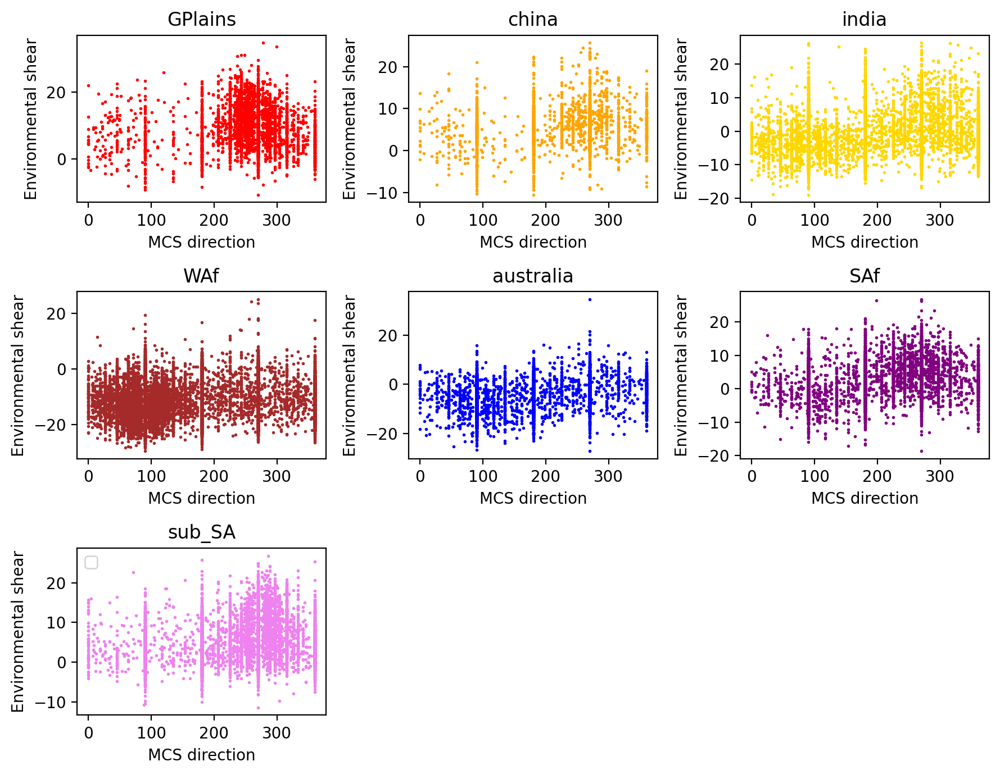

In [14]:
f = plt.figure(figsize=(9,7), dpi=200)


colors = ['red', 'orange', 'gold', 'brown', 'blue', 'purple', 'violet']

for ids, regs in enumerate(MREGIONS.keys()):
    ax = f.add_subplot(3,3,ids+1)
    var2 = 'ushear100m_650'
    var1 = 'direction'
    
    dat = rdics[regs]
    
    x = dat[var1]
    y = dat[var2]
    ax.set_xlabel('MCS direction')
    ax.set_ylabel('Environmental shear')
    plt.title(regs)


#     if ids >= 4:
#         x = x*-1
        
    #ax.set_ylim(-1,1)
        
    ax.scatter(x, y, color=colors[ids], marker='o', s=1)
    #plt.errorbar(np.mean(x), np.mean(y), yerr=np.std(y), xerr=np.std(x), fmt="x", color=colors[ids], linewidth=1, label=regs)
plt.legend()
plt.tight_layout()
#f.savefig('/home/ck/DIR/cornkle/figs/LMCS/MCS_afternoon_direction_scatter.jpg')

Text(0.5, 1.0, 'sub_SA Pmax')

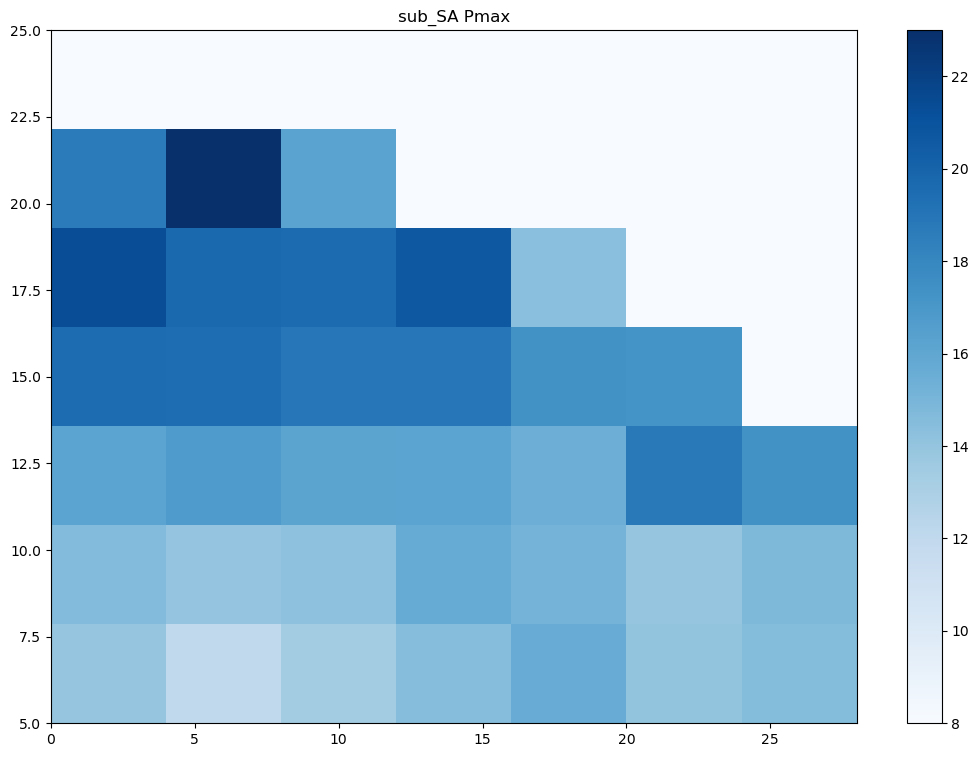

In [15]:
f= plt.figure(figsize=(13,9), dpi=100)
ax = f.add_subplot(111)


tlist = []
slist = []
plist = []

rstack = []
cstack = []

for ids, regs in enumerate(MREGIONS.keys()):
    
    if regs in ['WAf', 'india', 'australia']:
        continue
    
    pick = rdics[regs]
    tbin = np.linspace(5,25,8)
    #tbin = np.linspace(5,65, 8)
    sbin = np.linspace(0,28,8)
    testbins = [sbin,tbin]
    func1 = lambda y: np.mean(y) #np.percentile(y,95, interpolation='nearest') #np.percentile(y, 95)
    func2 = lambda y: np.sum(np.isfinite(y))
    func3 = lambda y: np.sum(y>1)

    xxu2 = pick['ushear925_650'].values.astype(np.float64)
    xxtc = pick['tcwv'].values
    xxtc = pick['q925'].values*1000
    xxch = pick['pmax'].values
    
    if ids in [2,3,4]:
        xxu2 = xxu2*-1
    
    tlist.extend(xxtc)
    slist.extend(xxu2)
    plist.extend(xxch)
    
   # ipdb.set_trace()
    
    ret = binned_statistic_2d(slist, tlist, plist, statistic=func1, bins=testbins)
    count = binned_statistic_2d(slist, tlist, plist, statistic=func2, bins=testbins)
    # thresh = binned_statistic_2d(xxu2, xxtc, xxch, statistic=func3, bins=testbins)
    
    dd=ret.statistic.T
    valid = count.statistic.T
    dd[valid<5] = 0
    
    if ids == 0:
        rstack = dd
    else:
        rstack += dd
        
rstack = rstack / len(MREGIONS.keys())

mp = plt.pcolormesh(testbins[0], testbins[1], dd, cmap='Blues', vmin=8, vmax=23) #vmax=p2-1, vmin=0.5  ##p2-1
plt.title(regs+' IQR ='+str(np.round(np.nanpercentile(xxch,75)-np.nanpercentile(xxch,25),2))+'K')
plt.colorbar(mp)
plt.title(regs+' Pmax')

Text(0.5, 1.0, 'sub_SA Pmax')

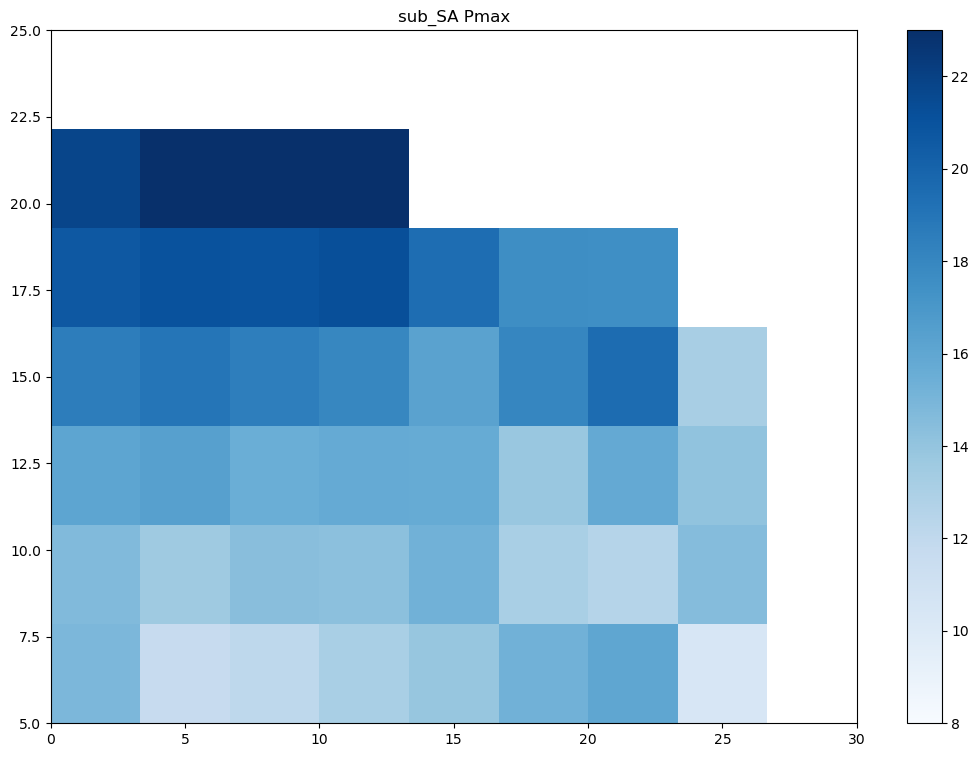

In [125]:
f= plt.figure(figsize=(13,9), dpi=100)

tlist = []
slist = []
plist = []

ax = f.add_subplot(111)

for ids, regs in enumerate(MREGIONS.keys()):
    
    if regs == 'WAf':
        continue

    
    pick = rdics[regs]
    tbin = np.linspace(5,25,8)
    #tbin = np.linspace(5,65,10)
    sbin = np.linspace(0,30,10)
    testbins = [sbin,tbin]
    func1 = lambda y: np.mean(y) #np.percentile(y,95, interpolation='nearest') #np.percentile(y, 95)
    func2 = lambda y: np.sum(np.isfinite(y))
    func3 = lambda y: np.sum(y>1)

    xxu2 = pick['ushear925_650'].values.astype(np.float64)
    #xxtc = pick['tcwv'].values#*1000
    xxtc = pick['q925'].values*1000
    xxch = pick['pmax'].values
    
    if ids in [2,3,4]:
        xxu2 = xxu2*-1
    
    tlist.extend(xxtc)
    slist.extend(xxu2)
    plist.extend(xxch)
    
   # ipdb.set_trace()
    
ret = binned_statistic_2d(slist, tlist, plist, statistic=func1, bins=testbins)
count = binned_statistic_2d(slist, tlist, plist, statistic=func2, bins=testbins)
# thresh = binned_statistic_2d(xxu2, xxtc, xxch, statistic=func3, bins=testbins)

dd=ret.statistic.T
valid = count.statistic.T
dd[valid<4] = np.nan

mp = plt.pcolormesh(testbins[0], testbins[1], dd, cmap='Blues', vmin=8, vmax=23) #vmax=p2-1, vmin=0.5  ##p2-1
plt.title(regs+' IQR ='+str(np.round(np.nanpercentile(xxch,75)-np.nanpercentile(xxch,25),2))+'K')
plt.colorbar(mp)
plt.title(regs+' Pmax')

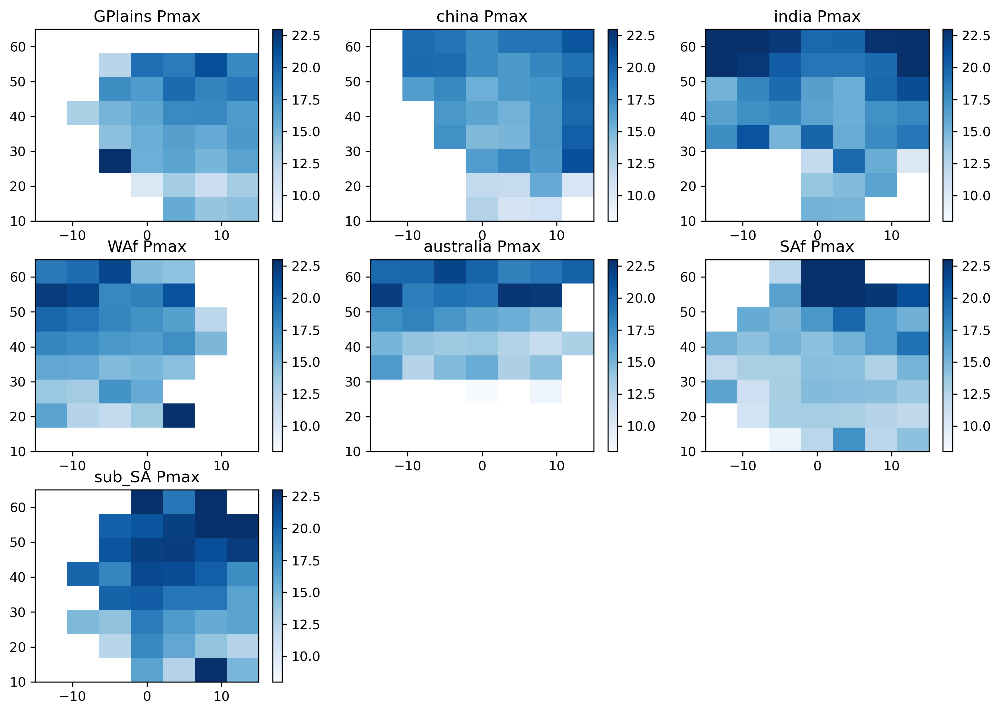

In [12]:
f= plt.figure(figsize=(13,9), dpi=300)
for ids, regs in enumerate(MREGIONS.keys()):
    ax = f.add_subplot(3,3,ids+1)
    
    pick = rdics[regs]
    #tbin = np.linspace(5,25,8)
    tbin = np.linspace(10,65,9)
    sbin = np.linspace(-15,15,8)
    testbins = [sbin,tbin]
    func1 = lambda y: np.mean(y) #np.percentile(y,95, interpolation='nearest') #np.percentile(y, 95)
    func2 = lambda y: np.sum(np.isfinite(y))
    func3 = lambda y: np.sum(y>1)

    xxu2 = pick['ushear100m_650'].values.astype(np.float64)
    xxtc = pick['tcwv'].values#*1000
    #xxtc = pick['q925'].values*1000
    xxch = pick['pmax'].values
    
   # ipdb.set_trace()
    
    ret = binned_statistic_2d(xxu2, xxtc, xxch, statistic=func1, bins=testbins)
    count = binned_statistic_2d(xxu2, xxtc, xxch, statistic=func2, bins=testbins)
    # thresh = binned_statistic_2d(xxu2, xxtc, xxch, statistic=func3, bins=testbins)

    dd=ret.statistic.T
    valid = count.statistic.T
    dd[valid<4] = np.nan

    mp = plt.pcolormesh(testbins[0], testbins[1], dd, cmap='Blues', vmin=8, vmax=23) #vmax=p2-1, vmin=0.5  ##p2-1
    plt.title(regs+' IQR ='+str(np.round(np.nanpercentile(xxch,75)-np.nanpercentile(xxch,25),2))+'K')
    plt.colorbar(mp)
    plt.title(regs+' Pmax')

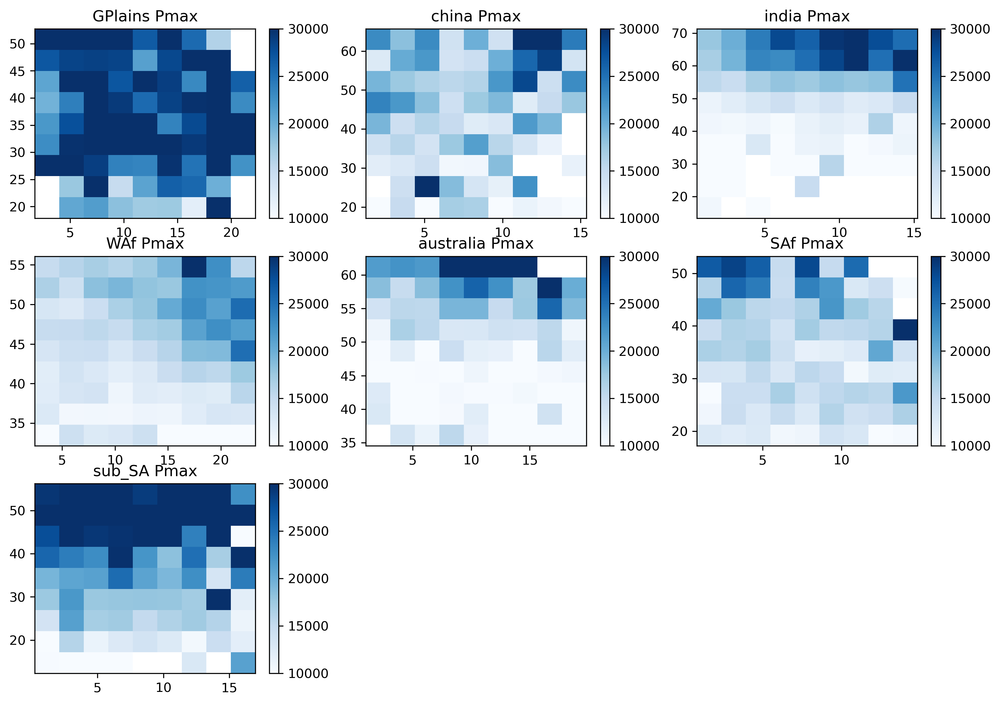

In [13]:
f= plt.figure(figsize=(13,9), dpi=300)
for ids, regs in enumerate(MREGIONS.keys()):
    ax = f.add_subplot(3,3,ids+1)
    
    pick = rdics[regs]
#     tbin = np.linspace(5,25,15)
#     #tbin = np.linspace(10,65,15)
#     sbin = np.linspace(-20,15,15)
    sbin = np.linspace(np.nanpercentile(pick['shear100m_650'],2), np.nanpercentile(pick['shear100m_650'],98),10)
    #tbin = np.linspace(np.nanpercentile(pick['q925']*1000,2), np.nanpercentile(pick['q925']*1000,98),15)
    tbin = np.linspace(np.nanpercentile(pick['tcwv'],2), np.nanpercentile(pick['tcwv'],98),10)
    #ipdb.set_trace()
    testbins = [sbin,tbin]
    func1 = lambda y: np.mean(y) #np.percentile(y,95, interpolation='nearest') #np.percentile(y, 95)
    func2 = lambda y: np.sum(np.isfinite(y))
    func3 = lambda y: np.sum(y>1)

    xxu2 = pick['shear100m_650'].values.astype(np.float64)
    xxtc = pick['tcwv'].values
    #xxtc = pick['q925'].values*1000
    xxch = pick['pf_area1'].values
    
   # ipdb.set_trace()
    
    ret = binned_statistic_2d(xxu2, xxtc, xxch, statistic=func1, bins=testbins)
    count = binned_statistic_2d(xxu2, xxtc, xxch, statistic=func2, bins=testbins)
    # thresh = binned_statistic_2d(xxu2, xxtc, xxch, statistic=func3, bins=testbins)

    dd=ret.statistic.T
    valid = count.statistic.T
    dd[valid<4] = np.nan

    mp = plt.pcolormesh(testbins[0], testbins[1], dd, cmap='Blues', vmin=10000, vmax=30000) #vmax=p2-1, vmin=0.5  ##p2-1
    plt.title(regs+' IQR ='+str(np.round(np.nanpercentile(xxch,75)-np.nanpercentile(xxch,25),2))+'K')
    plt.colorbar(mp)
    plt.title(regs+' Pmax')

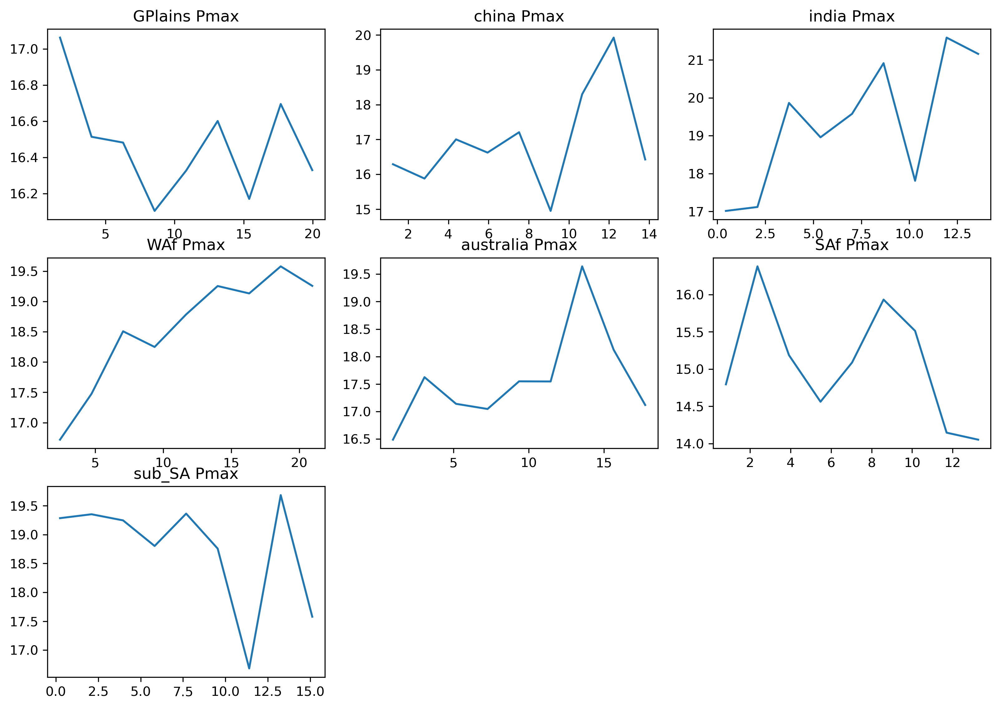

In [19]:
f= plt.figure(figsize=(13,9), dpi=300)
for ids, regs in enumerate(MREGIONS.keys()):
    ax = f.add_subplot(3,3,ids+1)
    
    pick = rdics[regs]
#     tbin = np.linspace(5,25,15)
#     #tbin = np.linspace(10,65,15)
#     sbin = np.linspace(-20,15,15)
    sbin = np.linspace(np.nanpercentile(pick['shear100m_650'],2), np.nanpercentile(pick['shear100m_650'],98),10)
    #tbin = np.linspace(np.nanpercentile(pick['q925']*1000,2), np.nanpercentile(pick['q925']*1000,98),15)
    tbin = np.linspace(np.nanpercentile(pick['tcwv'],2), np.nanpercentile(pick['tcwv'],98),10)
    #ipdb.set_trace()
    testbins = [sbin,tbin]
    func1 = lambda y: np.mean(y) #np.percentile(y,95, interpolation='nearest') #np.percentile(y, 95)
    func2 = lambda y: np.sum(np.isfinite(y))
    func3 = lambda y: np.sum(y>1)

    xxu2 = pick['shear100m_650'].values.astype(np.float64)
    xxtc = pick['tcwv'].values
    #xxtc = pick['q925'].values*1000
    xxch = pick['pf_area1'].values
    
   # ipdb.set_trace()
    
    ret = binned_statistic_2d(xxu2, xxtc, xxch, statistic=func1, bins=testbins)
    count = binned_statistic_2d(xxu2, xxtc, xxch, statistic=func2, bins=testbins)
    # thresh = binned_statistic_2d(xxu2, xxtc, xxch, statistic=func3, bins=testbins)

    dd=ret.statistic.T
    valid = count.statistic.T
    dd[valid<4] = np.nan
    
    pplot = np.nanmean(dd, axis=0)

    plt.plot(testbins[0][0:-1], pplot)
    plt.title(regs+' IQR ='+str(np.round(np.nanpercentile(xxch,75)-np.nanpercentile(xxch,25),2))+'K')
    plt.colorbar(mp)
    plt.title(regs+' Pmax')

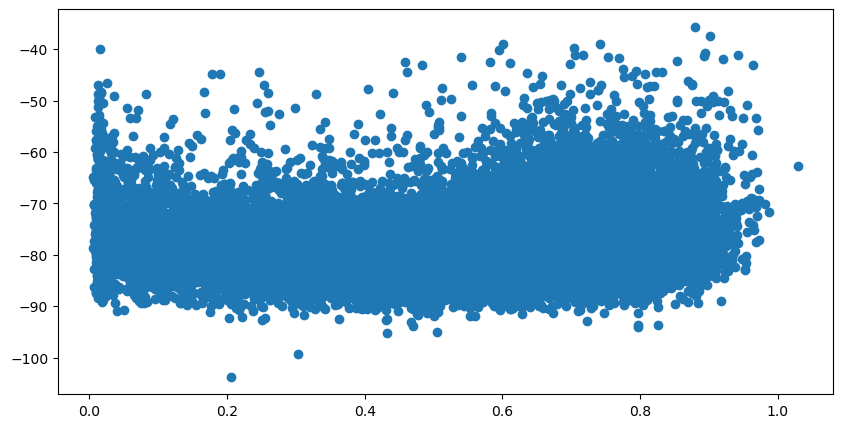

In [19]:
plt.scatter((rdics['WAf'])['ef'], (rdics['WAf'])['tmin']-273.15)

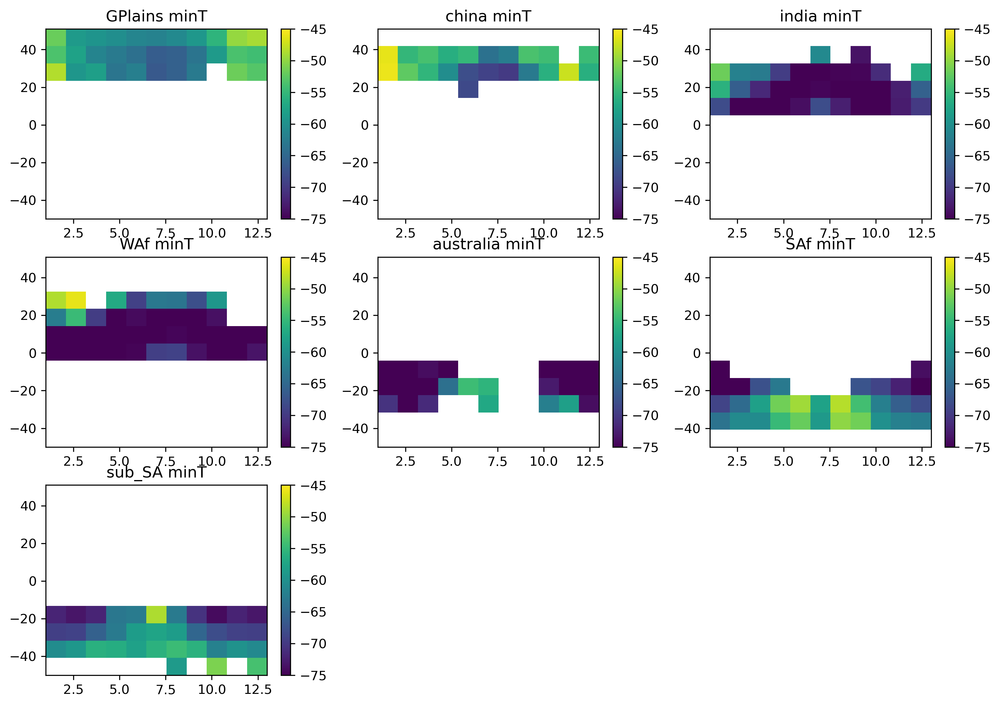

In [20]:
f= plt.figure(figsize=(13,9), dpi=300)
for ids, regs in enumerate(MREGIONS.keys()):
    ax = f.add_subplot(3,3,ids+1)
    
    pick = rdics[regs]
    tbin = np.linspace(-50,51,12)
    sbin = np.linspace(1,13,12)

    testbins = [sbin,tbin]
    func1 = lambda y: np.mean(y) #np.percentile(y,95, interpolation='nearest') #np.percentile(y, 95)
    func2 = lambda y: np.sum(np.isfinite(y))
    func3 = lambda y: np.sum(y>1)

    xxu2 = pick['utc_month'].values.astype(np.float64)
    xxtc = pick['meanlat'].values
    xxch = pick['corecold_mintb'].values-273.15
    
   # ipdb.set_trace()
    
    ret = binned_statistic_2d(xxu2, xxtc, xxch, statistic=func1, bins=testbins)
    # count = binned_statistic_2d(xxu2, xxtc, xxch, statistic=func2, bins=testbins)
    # thresh = binned_statistic_2d(xxu2, xxtc, xxch, statistic=func3, bins=testbins)

    dd=ret.statistic.T

    mp = plt.pcolormesh(testbins[0], testbins[1], dd, cmap='viridis', vmin=-75, vmax=-45) #vmax=p2-1, vmin=0.5  ##p2-1
    plt.title(regs+' IQR ='+str(np.round(np.nanpercentile(xxch,75)-np.nanpercentile(xxch,25),2))+'K')
    plt.colorbar(mp)
    plt.title(regs+' minT')

/home/ck/pythonWorkspace/proj_CEH/endgame/hist2d.py:437: RuntimeWarning: invalid value encountered in divide
  outdic['y'].append(np.sum(yvar[mask]>gt)/float(np.sum(np.isfinite(yvar[mask]))))


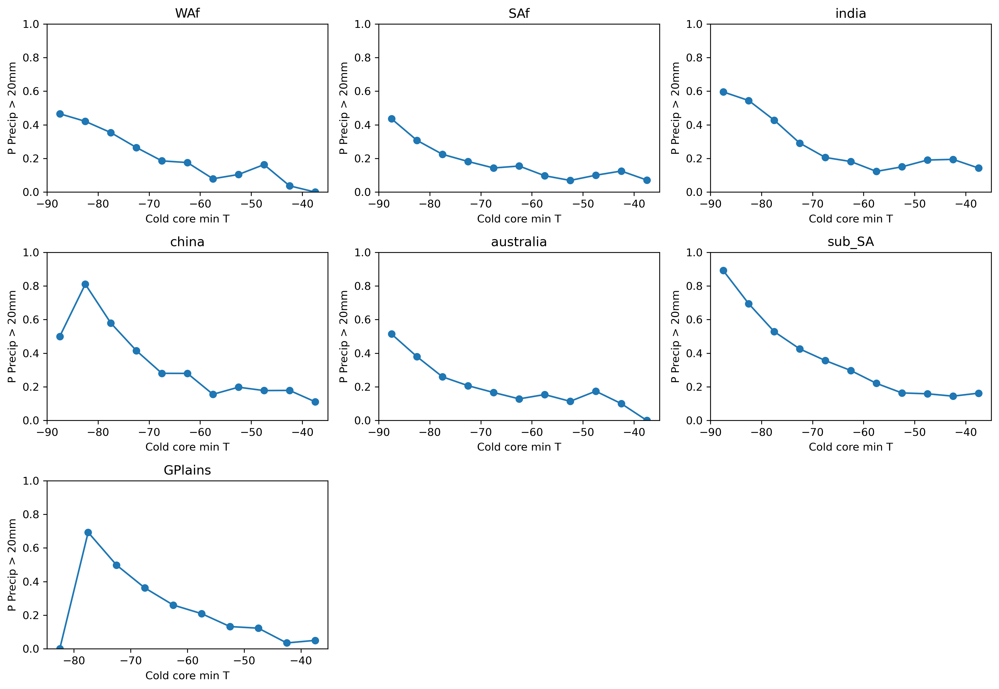

In [30]:
f= plt.figure(figsize=(13,9), dpi=300)
for ids, regs in enumerate(MREGIONS.keys()):
    ax = f.add_subplot(3,3,ids+1)
    outdic = hist2d.var2_binning_threshold((rdics[regs]['corecold_mintb']-273.15).values, (rdics[regs]['pf_maxrainrate1']).values, np.arange(-90,-30,5), gt=20)
    plt.plot(outdic['xbins'], outdic['y'], '-o')
    plt.title(regs)
    ax.set_ylim(0,1)
    plt.ylabel('P Precip > 20mm')
    plt.xlabel('Cold core min T')
plt.tight_layout()
#f.savefig('/home/ck/Desktop/lmcs/20mm_precip_vs_CC_minT.jpg')

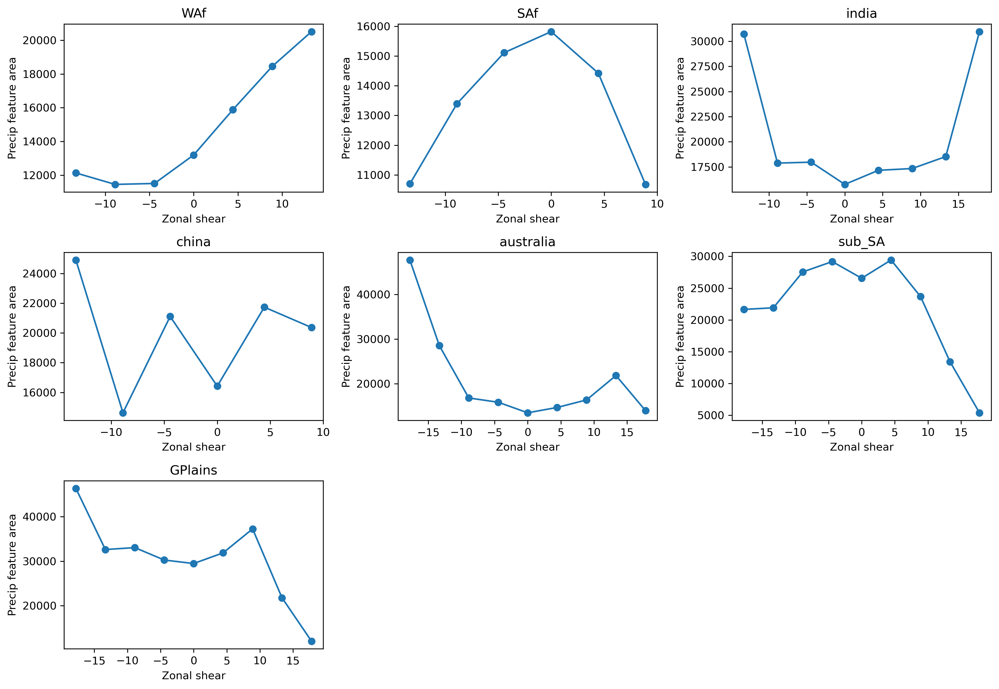

In [41]:
f= plt.figure(figsize=(13,9), dpi=300)
for ids, regs in enumerate(MREGIONS.keys()):
    ax = f.add_subplot(3,3,ids+1)
    outdic = hist2d.var2_binning_mean((rdics[regs]['u925']).values, (rdics[regs]['pf_area1']).values, np.linspace(-20,20,10))
    plt.plot(outdic['xbins'], outdic['y'], '-o')
    #plt.scatter(rdics[regs]['ushear100m_650'], rdics[regs]['pf_area1'])
    plt.title(regs)
    #ax.set_ylim(0,1)
    plt.ylabel('Precip feature area')
    plt.xlabel('Zonal shear')
plt.tight_layout()
#f.savefig('/home/ck/Desktop/lmcs/20mm_precip_vs_CC_minT.jpg')

In [20]:
def moving_average(x, w):
    return np.convolve(x, np.ones(w), 'valid') / w

GPlains PearsonRResult(statistic=-0.19751585232016092, pvalue=9.41707817776695e-29)
china PearsonRResult(statistic=0.11295235484146744, pvalue=1.6609046930247184e-06)
india PearsonRResult(statistic=-0.053870379330539155, pvalue=1.6382304014013544e-07)
WAf PearsonRResult(statistic=-0.21555019385645, pvalue=1.534322270803017e-233)
australia PearsonRResult(statistic=-0.4574092687192367, pvalue=1.0152990116778702e-210)
SAf PearsonRResult(statistic=-0.19350387470647754, pvalue=8.367004338123882e-47)
sub_SA PearsonRResult(statistic=0.08554481739599407, pvalue=2.2154988380061377e-11)


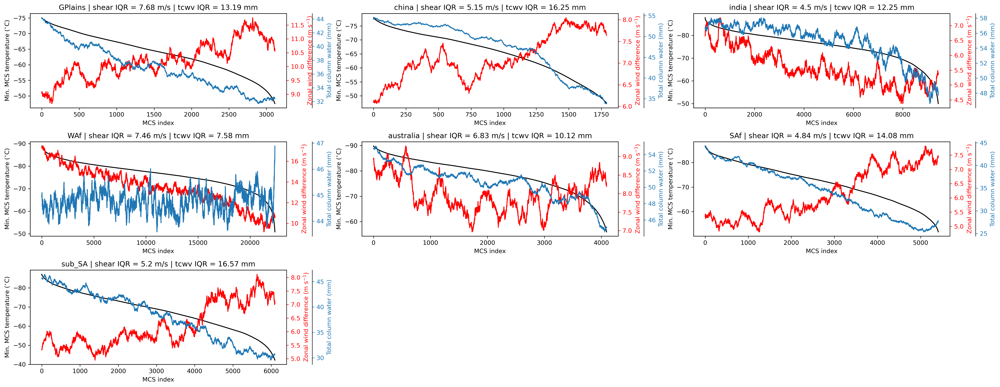

In [25]:
f= plt.figure(figsize=(23,9), dpi=300)
for ids, regs in enumerate(MREGIONS.keys()):
    ax = f.add_subplot(3,3,ids+1)
    
    obs = rdics[regs]
    
    obsord = obs[np.isfinite(obs['corecold_mintb']) & np.isfinite(obs['shear100m_650'])] # & np.isfinite(obs['q925']) & np.isfinite(obs['t925'])
    inds = np.argsort(obsord['corecold_mintb'])

    minus = -20000
    pro = obsord['corecold_mintb'].values[inds]-273.15#[minus::]
    sho = obsord['shear100m_650'].values[inds]#[minus::]
    tco = obsord['tcwv'].values[inds]#[minus::]
#     qco = obsord['q925'].values[inds]#[minus::]
#     temp = obsord['t925'].values[inds]#[minus::]
#     qupco = obsord['q650'].values[inds]#[minus::]
    
#     if ids in [2,3,4]: 
#         sho = sho * -1
#         print(regs, 'doing minus 1')

    #tco = tco * -1
        #sho = sho * -1

    
    ax2 = ax.twinx()
    #ax3 = ax.twinx()
    ax4 = ax.twinx()

    agg = 200


    # Offset the right spine of twin2.  The ticks and label have already been
    # placed on the right by twinx above.
    #ax2.spines["right"].set_position(("axes", 1.02))
    #ax3.spines["right"].set_position(("axes", 1.1))
    ax4.spines["right"].set_position(("axes", 1.1))

    ax.plot(moving_average(pro,agg), label='pf1 area', color='k')
    ax.invert_yaxis()
    
    plt.title(regs+' | shear IQR = '+str(np.round(np.nanpercentile(sho,75)-np.nanpercentile(sho,25),2))+' m/s' + ' | tcwv IQR = '+str(np.round(np.nanpercentile(tco,75)-np.nanpercentile(tco,25),2))+' mm')

    p4, = ax4.plot(moving_average(tco,agg), label='tcwv')
    p2, = ax2.plot(moving_average(sho,agg), label='ushear', color='r')
#     if ids in [2,3,4]: 
#         print(regs, 'doing minus 1')
#         ax2.invert_yaxis()
    #p3, = ax3.plot(moving_average(qco,500), label='q925', color='purple')
    #p4, = ax4.plot(moving_average(temp,500), label='t925', color='orange')

    ax2.yaxis.label.set_color(p2.get_color())
    #ax3.yaxis.label.set_color(p3.get_color())
    ax4.yaxis.label.set_color(p4.get_color())

    tw = moving_average(tco,agg)
    twd = tw[1::]-tw[0:-1]
    sw = moving_average(sho,agg)
    swd = sw[1::]-sw[0:-1]

    print(regs, stats.pearsonr(twd,swd))

    ax.set_ylabel('Min. MCS temperature ($^{\circ}$C)')
    ax2.set_ylabel('Zonal wind difference (m s$^{-1}$)')
    ax4.set_ylabel('Total column water (mm)')


    ax2.tick_params(axis='y', colors=p2.get_color())
    #ax3.tick_params(axis='y', colors=p3.get_color() )
    ax4.tick_params(axis='y', colors=p4.get_color())

    
    ax.set_xlabel('MCS index')

    
plt.tight_layout()
f.savefig('/home/ck/DIR/cornkle/figs/ENDGAME/ordered_MCSs/minT_TCW_zonalShear.jpg')

In [26]:
obs.keys()

Index(['direction', 'tminlon', 'tminlat', 'tmin_calc', 'tmin', 'tmean_core',
       'tmean_ccs', 'tcwv', 'tgrad2m', 'tgrad925',
       ...
       'init_lon', 'init_lat', 'utc_init_time', 'utc_init_hour',
       'lt_init_time', 'lt_init_hour', 'lt_time', 'lt_date', 'lt_hour',
       'lt_day'],
      dtype='object', length=154)

GPlains PearsonRResult(statistic=-0.24190460605101552, pvalue=1.0822054502605531e-42)
china PearsonRResult(statistic=-0.10122867167237021, pvalue=1.7798535696265126e-05)
india doing minus 1
india PearsonRResult(statistic=-0.05004365418763928, pvalue=1.1512103800640758e-06)
WAf doing minus 1
WAf PearsonRResult(statistic=0.12330206704803925, pvalue=1.522568049144032e-76)
australia doing minus 1
australia PearsonRResult(statistic=0.02441313593281589, pvalue=0.11846660049799188)
SAf PearsonRResult(statistic=-0.17093739011295306, pvalue=9.303596193399569e-37)
sub_SA PearsonRResult(statistic=-0.1711919593260085, pvalue=2.509805520984516e-41)


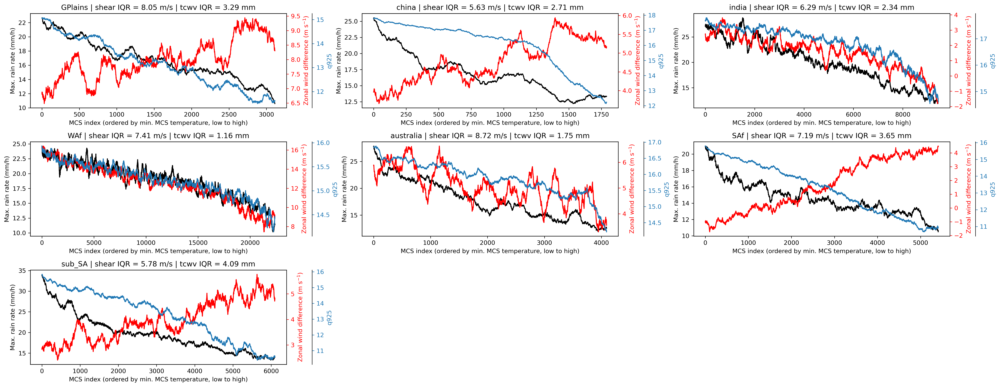

In [45]:
f= plt.figure(figsize=(23,9), dpi=300)
for ids, regs in enumerate(MREGIONS.keys()):
    ax = f.add_subplot(3,3,ids+1)
    
    obs = rdics[regs]
    
    obsord = obs[np.isfinite(obs['corecold_mintb']) & np.isfinite(obs['ushear100m_650'])] # & np.isfinite(obs['q925']) & np.isfinite(obs['t925'])
    inds = np.argsort(obsord['corecold_mintb'])

    minus = -20000
    pro = obsord['pf_maxrainrate1'].values[inds]#[minus::]
    sho = obsord['ushear100m_650'].values[inds]#[minus::]
    tco = obsord['q925'].values[inds]*1000#[minus::]
#     qco = obsord['q925'].values[inds]#[minus::]
#     temp = obsord['t925'].values[inds]#[minus::]
#     qupco = obsord['q650'].values[inds]#[minus::]
    
    if ids in [2,3,4]: 
        sho = sho * -1
        print(regs, 'doing minus 1')

    #tco = tco * -1
        #sho = sho * -1

    
    ax2 = ax.twinx()
    #ax3 = ax.twinx()
    ax4 = ax.twinx()

    agg = 200


    # Offset the right spine of twin2.  The ticks and label have already been
    # placed on the right by twinx above.
    #ax2.spines["right"].set_position(("axes", 1.02))
    #ax3.spines["right"].set_position(("axes", 1.1))
    ax4.spines["right"].set_position(("axes", 1.1))

    ax.plot(moving_average(pro,agg), label='pf1 area', color='k')
    #ax.invert_yaxis()
    
    plt.title(regs+' | shear IQR = '+str(np.round(np.nanpercentile(sho,75)-np.nanpercentile(sho,25),2))+' m/s' + ' | tcwv IQR = '+str(np.round(np.nanpercentile(tco,75)-np.nanpercentile(tco,25),2))+' mm')

    p4, = ax4.plot(moving_average(tco,agg), label='tcwv')
    p2, = ax2.plot(moving_average(sho,agg), label='ushear', color='r')
#     if ids in [2,3,4]: 
#         print(regs, 'doing minus 1')
#         ax2.invert_yaxis()
    #p3, = ax3.plot(moving_average(qco,500), label='q925', color='purple')
    #p4, = ax4.plot(moving_average(temp,500), label='t925', color='orange')

    ax2.yaxis.label.set_color(p2.get_color())
    #ax3.yaxis.label.set_color(p3.get_color())
    ax4.yaxis.label.set_color(p4.get_color())

    tw = moving_average(tco,agg)
    twd = tw[1::]-tw[0:-1]
    sw = moving_average(sho,agg)
    swd = sw[1::]-sw[0:-1]

    print(regs, stats.pearsonr(twd,swd))

    ax.set_ylabel('Max. rain rate (mm/h)')
    ax2.set_ylabel('Zonal wind difference (m s$^{-1}$)')
    ax4.set_ylabel('q925')


    ax2.tick_params(axis='y', colors=p2.get_color())
    #ax3.tick_params(axis='y', colors=p3.get_color() )
    ax4.tick_params(axis='y', colors=p4.get_color())

    
    ax.set_xlabel('MCS index (ordered by min. MCS temperature, low to high)')

    
plt.tight_layout()
f.savefig('/home/ck/DIR/cornkle/figs/LMCS/CMIP_LS3MIP/ERA5_only/minT_ordered_maxRain_shear_q925.jpg')

In [110]:
print(list(rdics['WAf'].keys()))

['direction', 'tminlon', 'tminlat', 'tmin_calc', 'tmin', 'tmean_core', 'tmean_ccs', 'tcwv', 'tgrad2m', 'tgrad925', 'smgrad', 'efgrad', 'shgrad', 'lhgrad', 'pmax', 'pmean', 'ptot', 'q925', 'q650', 'q850', 'era_precip', 'sm', 'ef', 'u925', 'u650', 'v925', 'v650', 'w925', 'w650', 'rh925', 'rh650', 't925', 't650', 'div925', 'div850', 'div650', 'pv925', 'pv650', 'ushear925_650', 'ushear850_650', 'ushear925_850', 'ushear100m_650', 'vshear925_650', 'vshear850_650', 'vshear925_850', 'vshear100m_650', 'shear925_650', 'shear850_650', 'shear925_850', 'shear100m_650', 'cape', 't2m', 'track_duration', 'start_status', 'end_status', 'start_basetime', 'end_basetime', 'start_split_cloudnumber', 'end_merge_cloudnumber', 'base_time', 'meanlat', 'meanlon', 'area', 'cloudnumber', 'track_status', 'track_interruptions', 'core_area', 'cold_area', 'corecold_mintb', 'corecold_meantb', 'core_meantb', 'mcs_duration', 'mcs_status', 'ccs_area', 'pf_npf', 'pf_lon1', 'pf_lon2', 'pf_lon3', 'pf_lat1', 'pf_lat2', 'pf_la

GPlains PearsonRResult(statistic=-0.14193009420412336, pvalue=1.7767495717102773e-15)
china PearsonRResult(statistic=-0.08607753965088272, pvalue=0.0002663260936301374)
india PearsonRResult(statistic=0.07651242734369247, pvalue=9.867254057631447e-14)
WAf PearsonRResult(statistic=0.014408360416342572, pvalue=0.031117193354542824)
australia PearsonRResult(statistic=-0.05678644221690926, pvalue=0.0002791302711362285)
SAf PearsonRResult(statistic=0.22661315655247147, pvalue=5.720730151856808e-64)
sub_SA PearsonRResult(statistic=-0.12794452387442792, pvalue=1.1212161802438333e-23)


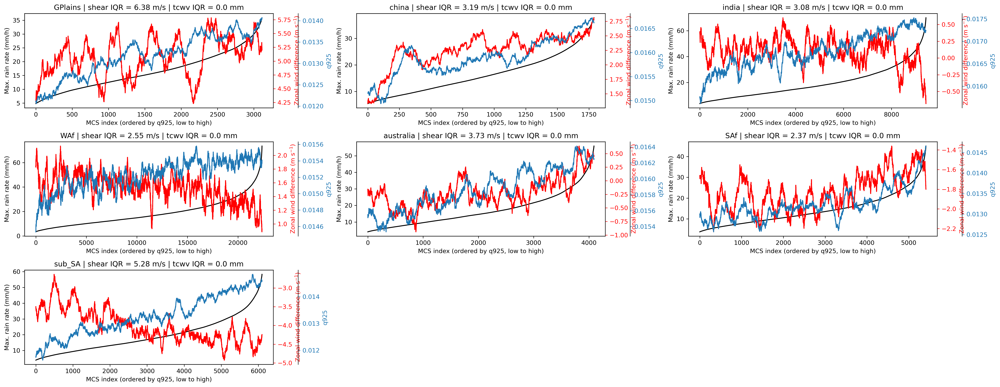

In [89]:
f= plt.figure(figsize=(23,9), dpi=300)
for ids, regs in enumerate(MREGIONS.keys()):
    ax = f.add_subplot(3,3,ids+1)
    
    obs = rdics[regs]
    
    obsord = obs[np.isfinite(obs['corecold_mintb']) & np.isfinite(obs['ushear100m_650'])] # & np.isfinite(obs['q925']) & np.isfinite(obs['t925'])
    inds = np.argsort(obsord['pf_maxrainrate1'])

    minus = -20000
    pro = obsord['pf_maxrainrate1'].values[inds]#[minus::]
    sho = obsord['v650'].values[inds]#[minus::]
    tco = obsord['q925'].values[inds]#[minus::]
#     qco = obsord['q925'].values[inds]#[minus::]
#     temp = obsord['t925'].values[inds]#[minus::]
#     qupco = obsord['q650'].values[inds]#[minus::]
    
#     if ids in [2,3,4]: 
#         sho = sho * -1
#         print(regs, 'doing minus 1 shear')
        
#     if ids in [4,5,6]: 
#         tco = tco * -1
#         print(regs, 'doing minus 1 shgrad')

    #tco = tco * -1
        #sho = sho * -1

    
    ax2 = ax.twinx()
    #ax3 = ax.twinx()
    ax4 = ax.twinx()

    agg = 200


    # Offset the right spine of twin2.  The ticks and label have already been
    # placed on the right by twinx above.
    #ax2.spines["right"].set_position(("axes", 1.02))
    #ax3.spines["right"].set_position(("axes", 1.1))
    ax4.spines["right"].set_position(("axes", 1.1))
    var1 = moving_average(pro,agg)
    ax.plot(var1, label='pf1 area', color='k')
    #ax.invert_yaxis()
    
    plt.title(regs+' | shear IQR = '+str(np.round(np.nanpercentile(sho,75)-np.nanpercentile(sho,25),2))+' m/s' + ' | tcwv IQR = '+str(np.round(np.nanpercentile(tco,75)-np.nanpercentile(tco,25),2))+' mm')

    p4, = ax4.plot(moving_average(tco,agg), label='tcwv')
    p2, = ax2.plot(moving_average(sho,agg), label='ushear', color='r')
#     if ids in [2,3,4]: 
#         print(regs, 'doing minus 1')
#         ax2.invert_yaxis()
    #p3, = ax3.plot(moving_average(qco,500), label='q925', color='purple')
    #p4, = ax4.plot(moving_average(temp,500), label='t925', color='orange')

    ax2.yaxis.label.set_color(p2.get_color())
    #ax3.yaxis.label.set_color(p3.get_color())
    ax4.yaxis.label.set_color(p4.get_color())

    tw = moving_average(tco,agg)
    twd = tw[1::]-tw[0:-1]
    sw = moving_average(sho,agg)
    swd = sw[1::]-sw[0:-1]
    vard = var1[1::]-var1[0:-1]


    print(regs, stats.pearsonr(twd,swd))
#     print(regs, 'humidity', stats.pearsonr(vard,twd))
#     print(regs, 'shear', stats.pearsonr(vard,swd))

    ax.set_ylabel('Max. rain rate (mm/h)')
    ax2.set_ylabel('Zonal wind difference (m s$^{-1}$)')
    ax4.set_ylabel('q925')


    ax2.tick_params(axis='y', colors=p2.get_color())
    #ax3.tick_params(axis='y', colors=p3.get_color() )
    ax4.tick_params(axis='y', colors=p4.get_color())

    
    ax.set_xlabel('MCS index (ordered by q925, low to high)')

    
plt.tight_layout()
#f.savefig('/home/ck/DIR/cornkle/figs/LMCS/CMIP_LS3MIP/ERA5_only/minT_ordered_maxRain_shear_q925.jpg')

GPlains PearsonRResult(statistic=-0.2638879618137833, pvalue=7.691087962184303e-35)
china PearsonRResult(statistic=-0.20293592845545255, pvalue=7.755342691146081e-06)
india PearsonRResult(statistic=-0.13495527637456442, pvalue=1.2111497429397482e-07)
WAf PearsonRResult(statistic=0.19220270905196743, pvalue=6.986912721409285e-99)
australia PearsonRResult(statistic=0.03714776328974742, pvalue=0.19494087337807298)
SAf PearsonRResult(statistic=-0.15920953608442173, pvalue=5.554791194620214e-08)
sub_SA PearsonRResult(statistic=-0.33811804201724627, pvalue=4.978455230832671e-61)


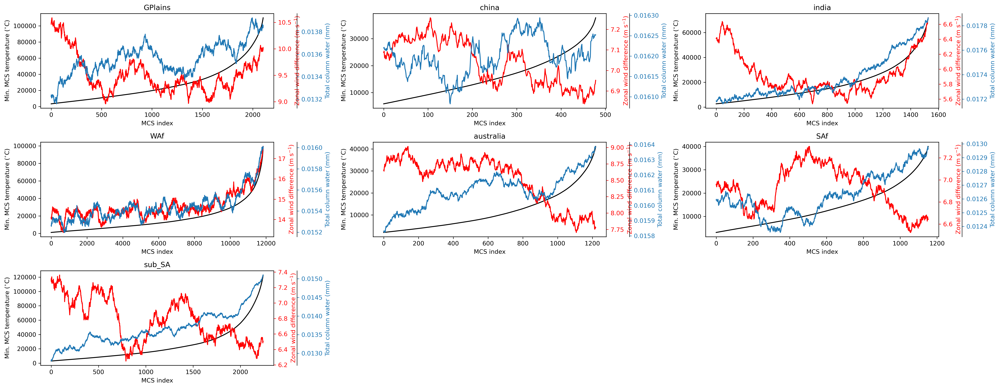

In [263]:
f= plt.figure(figsize=(23,9), dpi=300)
for ids, regs in enumerate(MREGIONS.keys()):
    ax = f.add_subplot(3,3,ids+1)
    
    obs = rdics[regs]
    
        
    umean = (obs['movement_distance_x'])
    vmean = (obs['movement_distance_y'])
    
    ws, avg_wd = u_met.u_v_to_ws_wd(umean,vmean)
    
    direct = avg_wd
    
    if ids in [0,1,5,6]: 
        posi = ((direct>180) & (obs['u650'] >= 0))
    else:
        posi = ((direct<180) & (obs['u650'] <= 0)) 
    
    obsord = obs[np.isfinite(obs['pf_area1']) & np.isfinite(obs['ushear925_650']) & (obs['tcwv'] >= np.percentile(obs['tcwv'],10)) & posi ] # & np.isfinite(obs['q925']) & np.isfinite(obs['t925']) #& (obs['q925'] >= np.percentile(obs['q925'],75))
    inds = np.argsort(obsord['pf_area1'])

    minus = -20000
    pro = obsord['pf_area1'].values[inds]#[minus::]
    sho = obsord['shear925_650'].values[inds]#[minus::]
    tco = obsord['q925'].values[inds]#[minus::]
#     qco = obsord['q925'].values[inds]#[minus::]
#     temp = obsord['t925'].values[inds]#[minus::]
#     qupco = obsord['q650'].values[inds]#[minus::]
    
#     if ids in [2,3,4]: 
#         sho = sho * -1
#         print(regs, 'doing minus 1')

    #tco = tco * -1
        #sho = sho * -1


    ax2 = ax.twinx()
    #ax3 = ax.twinx()
    ax4 = ax.twinx()

    agg = 300


    # Offset the right spine of twin2.  The ticks and label have already been
    # placed on the right by twinx above.
    #ax2.spines["right"].set_position(("axes", 1.02))
    #ax3.spines["right"].set_position(("axes", 1.1))
    ax4.spines["right"].set_position(("axes", 1.1))

    ax.plot(moving_average(pro,agg), label='pf1 area', color='k')
    #ax.invert_yaxis()
    


    p4, = ax4.plot(moving_average(tco,agg), label='tcwv')
    p2, = ax2.plot(moving_average(sho,agg), label='ushear', color='r')
#     if ids in [2,3,4]: 
#         print(regs, 'doing minus 1')
#         ax2.invert_yaxis()
    #p3, = ax3.plot(moving_average(qco,500), label='q925', color='purple')
    #p4, = ax4.plot(moving_average(temp,500), label='t925', color='orange')

    ax2.yaxis.label.set_color(p2.get_color())
    #ax3.yaxis.label.set_color(p3.get_color())
    ax4.yaxis.label.set_color(p4.get_color())

    tw = moving_average(tco,agg)
    twd = tw[1::]-tw[0:-1]
    sw = moving_average(sho,agg)
    swd = sw[1::]-sw[0:-1]

    print(regs, stats.pearsonr(twd,swd))

    ax.set_ylabel('Min. MCS temperature ($^{\circ}$C)')
    ax2.set_ylabel('Zonal wind difference (m s$^{-1}$)')
    ax4.set_ylabel('Total column water (mm)')


    ax2.tick_params(axis='y', colors=p2.get_color())
    #ax3.tick_params(axis='y', colors=p3.get_color() )
    ax4.tick_params(axis='y', colors=p4.get_color())

    ax.set_title(regs)
    ax.set_xlabel('MCS index')

    
plt.tight_layout()
#f.savefig('/home/ck/DIR/cornkle/figs/ENDGAME/ordered_MCSs/minT_ordered_15000.jpg')

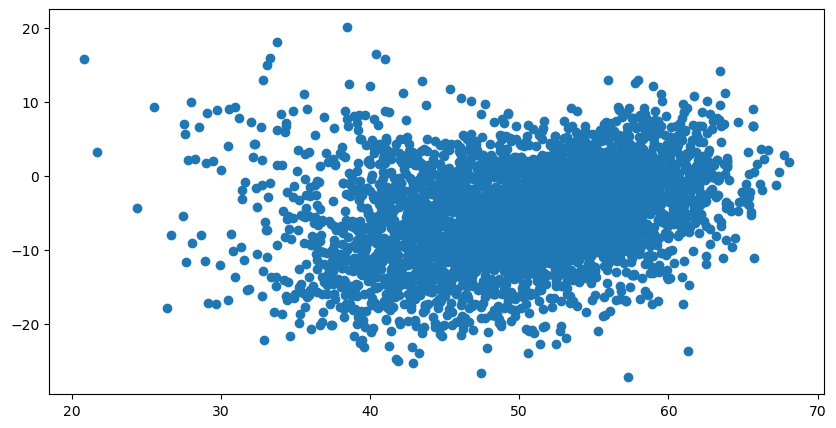

In [177]:
obs = rdics['australia']
plt.scatter(obs['tcwv'], obs['ushear100m_650'])

PearsonRResult(statistic=-0.2980053366275935, pvalue=6.043060890148069e-51)
PearsonRResult(statistic=-0.12966548133268546, pvalue=0.001224212449532231)
PearsonRResult(statistic=-0.049278733078035986, pvalue=0.04001681377554234)
PearsonRResult(statistic=0.1511263746697714, pvalue=2.062544365846601e-69)
PearsonRResult(statistic=0.026741379848172497, pvalue=0.2931999789578762)
PearsonRResult(statistic=-0.20179799311301783, pvalue=5.591783931545431e-17)
PearsonRResult(statistic=-0.38228621889781617, pvalue=9.165466624122643e-91)


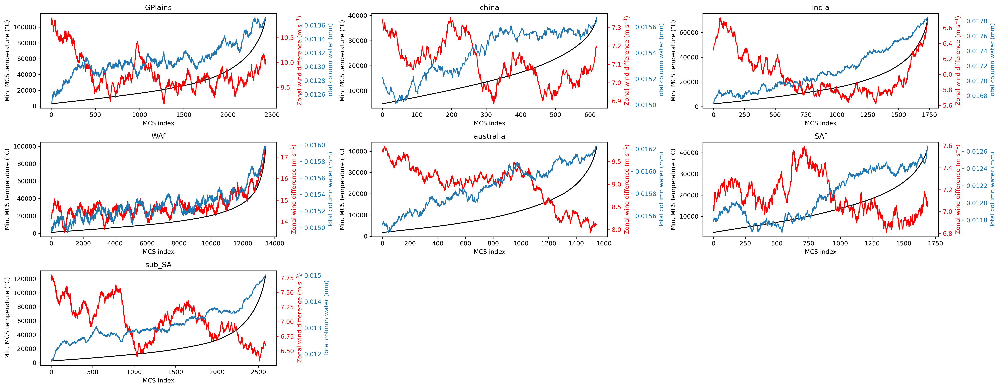

In [249]:
f= plt.figure(figsize=(23,9), dpi=300)
for ids, regs in enumerate(MREGIONS.keys()):
    ax = f.add_subplot(3,3,ids+1)
    
    obs = rdics[regs]
    
    umean = (obs['movement_distance_x'])
    vmean = (obs['movement_distance_y'])
    
    ws, avg_wd = u_met.u_v_to_ws_wd(umean,vmean)
    
    direct = avg_wd
    
    
    if ids in [0,1,5,6]: 
        posi = ((direct>=180) & (obs['u650'] >= 0))
    else:
        posi = ((direct<=180) & (obs['u650'] <= 0)) 
    
    obsord = obs[np.isfinite(obs['pf_area1']) & np.isfinite(obs['ushear925_650']) & posi] # & np.isfinite(obs['q925']) & np.isfinite(obs['t925'])
    inds = np.argsort(obsord['pf_area1'])

    minus = -20000
    pro = obsord['pf_area1'].values[inds]#[minus::]
    sho = obsord['shear925_650'].values[inds]#[minus::]
    tco = obsord['q925'].values[inds]#[minus::]
#     qco = obsord['q925'].values[inds]#[minus::]
#     temp = obsord['t925'].values[inds]#[minus::]
#     qupco = obsord['q650'].values[inds]#[minus::]
    
#     if ids in [2,3,4]: 
#         sho = sho * -1
#         print(regs, 'doing minus 1')

    #tco = tco * -1
        #sho = sho * -1


    ax2 = ax.twinx()
    #ax3 = ax.twinx()
    ax4 = ax.twinx()

    agg = 300


    # Offset the right spine of twin2.  The ticks and label have already been
    # placed on the right by twinx above.
    #ax2.spines["right"].set_position(("axes", 1.02))
    #ax3.spines["right"].set_position(("axes", 1.1))
    ax4.spines["right"].set_position(("axes", 1.1))

    ax.plot(moving_average(pro,agg), label='pf1 area', color='k')
    #ax.invert_yaxis()
    


    p4, = ax4.plot(moving_average(tco,agg), label='tcwv')
    p2, = ax2.plot(moving_average(sho,agg), label='ushear', color='r')
#     if ids in [2,3,4]: 
#         print(regs, 'doing minus 1')
#         ax2.invert_yaxis()
    #p3, = ax3.plot(moving_average(qco,500), label='q925', color='purple')
    #p4, = ax4.plot(moving_average(temp,500), label='t925', color='orange')

    ax2.yaxis.label.set_color(p2.get_color())
    #ax3.yaxis.label.set_color(p3.get_color())
    ax4.yaxis.label.set_color(p4.get_color())

    tw = moving_average(tco,agg)
    twd = tw[1::]-tw[0:-1]
    sw = moving_average(sho,agg)
    swd = sw[1::]-sw[0:-1]

    print(stats.pearsonr(twd,swd))

    ax.set_ylabel('Min. MCS temperature ($^{\circ}$C)')
    ax2.set_ylabel('Zonal wind difference (m s$^{-1}$)')
    ax4.set_ylabel('Total column water (mm)')


    ax2.tick_params(axis='y', colors=p2.get_color())
    #ax3.tick_params(axis='y', colors=p3.get_color() )
    ax4.tick_params(axis='y', colors=p4.get_color())

    ax.set_title(regs)
    ax.set_xlabel('MCS index')

    
plt.tight_layout()
#f.savefig('/home/ck/DIR/cornkle/figs/ENDGAME/ordered_MCSs/minT_ordered_15000.jpg')

In [69]:
from utils import u_statistics as u_stats

24
10
13
18
9
16
22


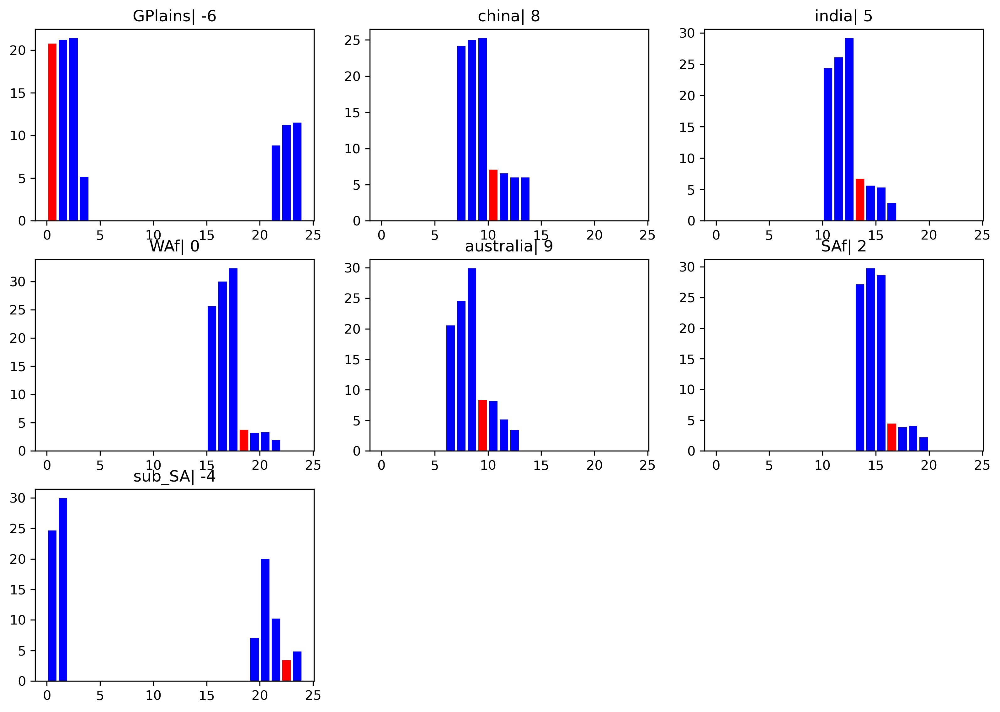

In [137]:
f= plt.figure(figsize=(13,9), dpi=300)
for ids, regs in enumerate(MREGIONS.keys()):
    ax = f.add_subplot(3,3,ids+1)
    
    pick = rdics[regs]
    hist_freq, hist_count, bin_edge = u_stats.histo_frequency(pick['utc_hour'], bins=np.arange(0,25))
    #print(np.unique(pick['hour']))
    mid_bin = bin_edge[0:-1] + (bin_edge[1::]-bin_edge[0:-1])/2
    #m_bin = mid_bin - (MREGIONS[regs])[2]
    #print(mid_bin)
    colors = ['b']*24
    ispos = int(np.where(mid_bin==18.5)[0])
    secpos = int(np.where(mid_bin==13.5)[0])
    firstpos = int(np.where(mid_bin==10.5)[0])
    #minpos = ispos-(MREGIONS[regs])[2]
    #ipdb.set_trace()
    minpos = ispos-(MREGIONS[regs])[2]
    miinpos = firstpos - (MREGIONS[regs])[2]
    miiinpos = secpos - (MREGIONS[regs])[2]
    print(minpos)
    if minpos == 24:
        minpos=0
    
    colors[minpos] = 'r'  # 1800
    colors[miinpos] = 'turquoise' # 1100
    colors[miiinpos] = 'purple' # 1400
    ax.bar(mid_bin,hist_freq, align='center', color=colors)
    ax.set_title(regs + '| '+str((MREGIONS[regs])[2]))


24
10
13
18
9
16
22


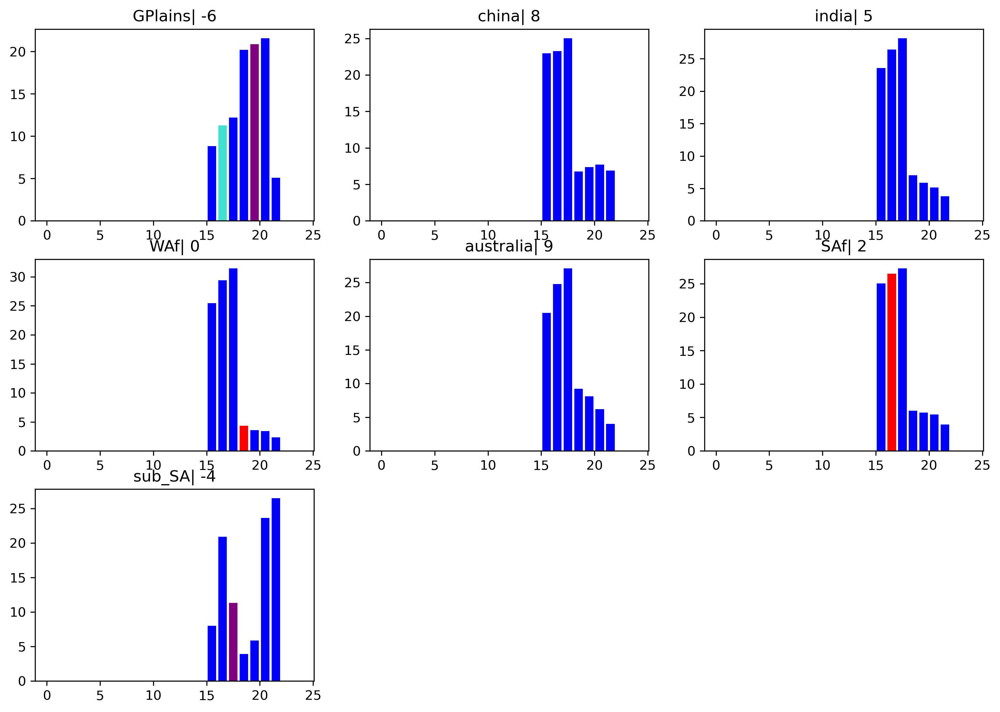

In [149]:
f= plt.figure(figsize=(13,9), dpi=300)
for ids, regs in enumerate(MREGIONS.keys()):
    ax = f.add_subplot(3,3,ids+1)
    
    pick = rdics[regs]
    hist_freq, hist_count, bin_edge = u_stats.histo_frequency(pick['lt_hour'], bins=np.arange(0,25))
    #print(np.unique(pick['hour']))
    mid_bin = bin_edge[0:-1] + (bin_edge[1::]-bin_edge[0:-1])/2
    #m_bin = mid_bin - (MREGIONS[regs])[2]
    #print(mid_bin)
    colors = ['b']*24
    ispos = int(np.where(mid_bin==18.5)[0])
    secpos = int(np.where(mid_bin==13.5)[0])
    firstpos = int(np.where(mid_bin==10.5)[0])
    #minpos = ispos-(MREGIONS[regs])[2]
    #ipdb.set_trace()
    minpos = ispos-(MREGIONS[regs])[2]
    miinpos = firstpos - (MREGIONS[regs])[2]
    miiinpos = secpos - (MREGIONS[regs])[2]
    print(minpos)
    if minpos == 24:
        minpos=0
    
    colors[minpos] = 'r'  # 1800
    colors[miinpos] = 'turquoise' # 1100
    colors[miiinpos] = 'purple' # 1400
    ax.bar(mid_bin,hist_freq, align='center', color=colors)
    ax.set_title(regs + '| '+str((MREGIONS[regs])[2]))

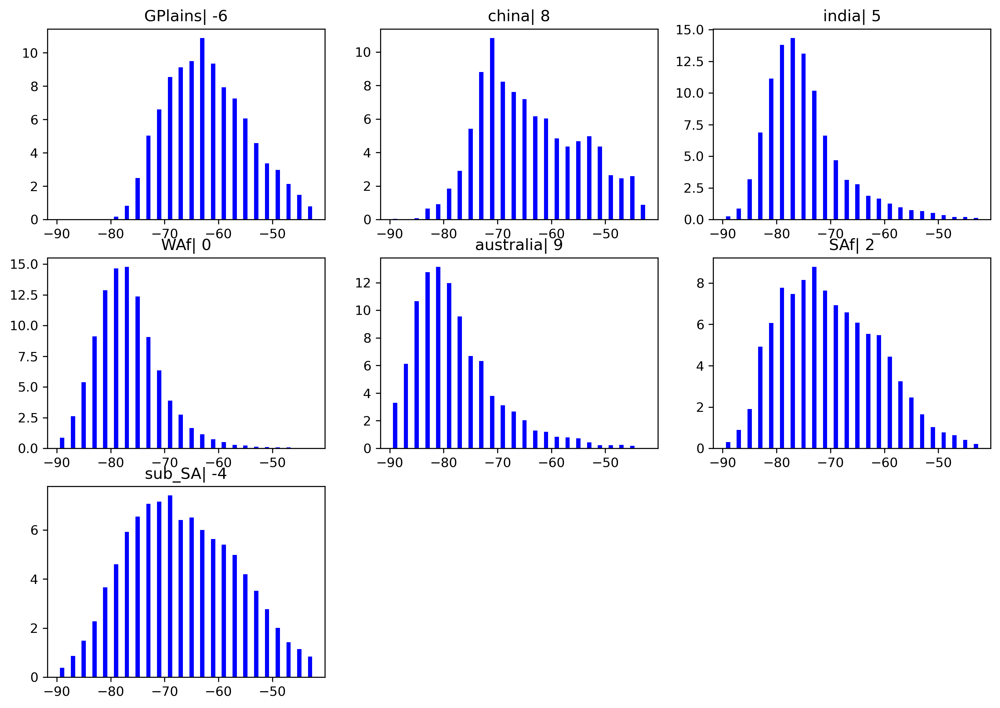

In [145]:
f= plt.figure(figsize=(13,9), dpi=300)
for ids, regs in enumerate(MREGIONS.keys()):
    ax = f.add_subplot(3,3,ids+1)
    
    pick = rdics[regs]

    hist_freq, hist_count, bin_edge = u_stats.histo_frequency(pick['corecold_mintb']-273.15, bins=np.arange(-90,-40,2))
    #print(np.unique(pick['hour']))
    mid_bin = bin_edge[0:-1] + (bin_edge[1::]-bin_edge[0:-1])/2
    #m_bin = mid_bin - (MREGIONS[regs])[2]
    #print(mid_bin)
    colors = ['b']*24
#     ispos = int(np.where(mid_bin==18.5)[0])
#     secpos = int(np.where(mid_bin==13.5)[0])
#     firstpos = int(np.where(mid_bin==10.5)[0])
#     #minpos = ispos-(MREGIONS[regs])[2]
#     #ipdb.set_trace()
#     minpos = ispos-(MREGIONS[regs])[2]
#     miinpos = firstpos - (MREGIONS[regs])[2]
#     miiinpos = secpos - (MREGIONS[regs])[2]
#     print(minpos)
#     if minpos == 24:
#         minpos=0
    
#     colors[minpos] = 'r'
#     colors[miinpos] = 'turquoise'
#     colors[miiinpos] = 'purple'
    ax.bar(mid_bin,hist_freq, align='center', color=colors)
    ax.set_title(regs + '| '+str((MREGIONS[regs])[2]))
#f.savefig('/home/ck/Desktop/lmcs/seasonal_cycle_storm_mint_dist.jpg')

Text(0.5, 1.0, 'Minimum storm temperature')

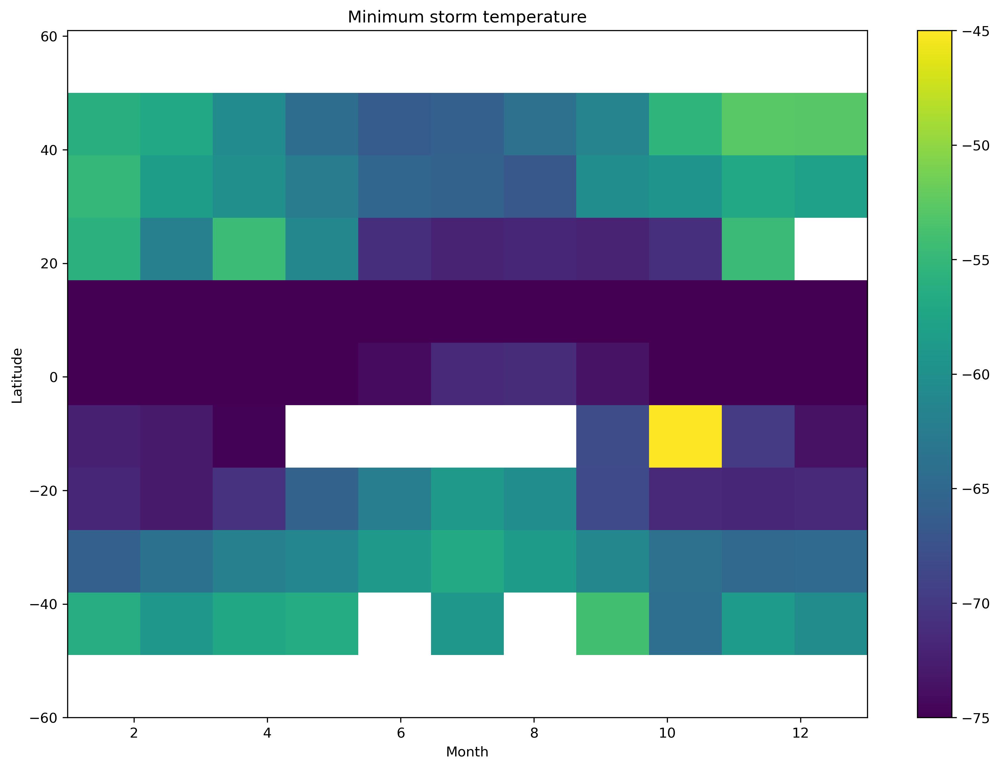

In [34]:
f= plt.figure(figsize=(13,9), dpi=300)
mon = []
lat = []
dat = []
for ids, regs in enumerate(MREGIONS.keys()):
    
    pick = rdics[regs]

    mon.extend(pick['utc_month'])
    lat.extend(pick['meanlat'])
    dat.extend(pick['corecold_mintb']-273.15)
    
    
tbin = np.linspace(-60,61,12)
sbin = np.linspace(1,13,12)

testbins = [sbin,tbin]
func1 = lambda y: np.mean(y) #np.percentile(y,95, interpolation='nearest') #np.percentile(y, 95)
func2 = lambda y: np.sum(np.isfinite(y))
func3 = lambda y: np.sum(y>1)

ax = f.add_subplot(111)

ret = binned_statistic_2d(mon, lat, dat, statistic=func1, bins=testbins)
# count = binned_statistic_2d(xxu2, xxtc, xxch, statistic=func2, bins=testbins)
# thresh = binned_statistic_2d(xxu2, xxtc, xxch, statistic=func3, bins=testbins)

dd=ret.statistic.T

mp = plt.pcolormesh(testbins[0], testbins[1], dd, cmap='viridis', vmin=-75, vmax=-45) #vmax=p2-1, vmin=0.5  ##p2-1
plt.colorbar(mp)
plt.ylabel('Latitude')
plt.xlabel('Month')
plt.title('Minimum storm temperature')

# colours = ['r', 'k', 'b', 'y', 'g', 'w', 'r']
# for ids, regs in enumerate(MREGIONS.keys()):
    
#     pick = rdics[regs]
#     plt.scatter(pick['month'],pick['meanlat'], marker='x', s=1, color=colours[ids], label=regs)
# plt.legend(loc='upper left')
#f.savefig('/home/ck/Desktop/lmcs/latitude_mean_minT_heatmap_mixed.jpg')

Text(0.5, 0, 'Month')

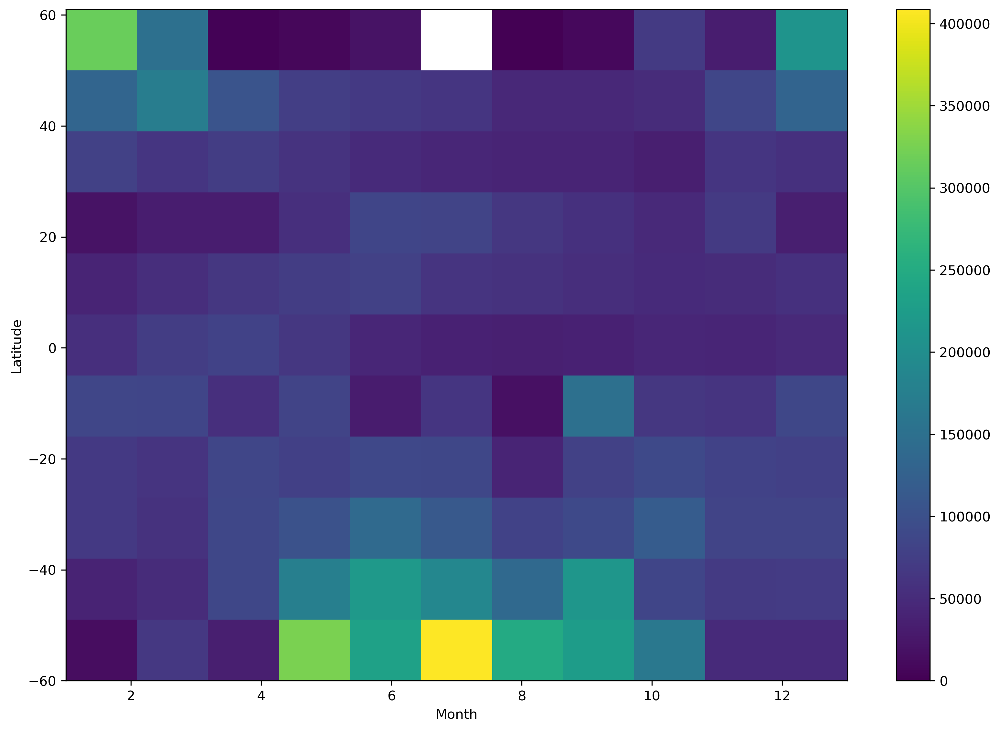

In [94]:
f= plt.figure(figsize=(13,9), dpi=300)
mon = []
lat = []
dat = []
for ids, regs in enumerate(MREGIONS.keys()):
    
    pick = rdics[regs]

    mon.extend(pick['utc_month'])
    lat.extend(pick['meanlat'])
    dat.extend(pick['core_area'])
    
    
tbin = np.linspace(-60,61,12)
sbin = np.linspace(1,13,12)

testbins = [sbin,tbin]
func1 = lambda y: np.mean(y) #np.percentile(y,95, interpolation='nearest') #np.percentile(y, 95)
func2 = lambda y: np.sum(np.isfinite(y))
func3 = lambda y: np.sum(y>1)

ax = f.add_subplot(111)

ret = binned_statistic_2d(mon, lat, dat, statistic=func1, bins=testbins)
# count = binned_statistic_2d(xxu2, xxtc, xxch, statistic=func2, bins=testbins)
# thresh = binned_statistic_2d(xxu2, xxtc, xxch, statistic=func3, bins=testbins)

dd=ret.statistic.T

mp = plt.pcolormesh(testbins[0], testbins[1], dd, cmap='viridis') #vmax=p2-1, vmin=0.5  ##p2-1
plt.colorbar(mp)
plt.ylabel('Latitude')
plt.xlabel('Month')

# colours = ['r', 'k', 'b', 'y', 'g', 'w', 'r']
# for ids, regs in enumerate(MREGIONS.keys()):
    
#     pick = rdics[regs]
#     plt.scatter(pick['month'],pick['meanlat'], marker='x', s=1, color=colours[ids], label=regs)
# plt.legend(loc='upper left')
#f.savefig('/home/ck/Desktop/lmcs/latitude_mean_minT_heatmap_ccsArea.jpg')

In [23]:
import windrose 
from windrose import WindroseAxes
from matplotlib import pyplot as plt
import matplotlib.cm as cm
import numpy as np
from matplotlib.projections import register_projection

register_projection(WindroseAxes)
color_s = ['red', 'blue', 'lime', 'yellow', 'violet', 'aqua', 'pink', 'grey', 'darkred', 'navy', 'green']

from utils import u_met

<Axes: ylabel='Frequency'>

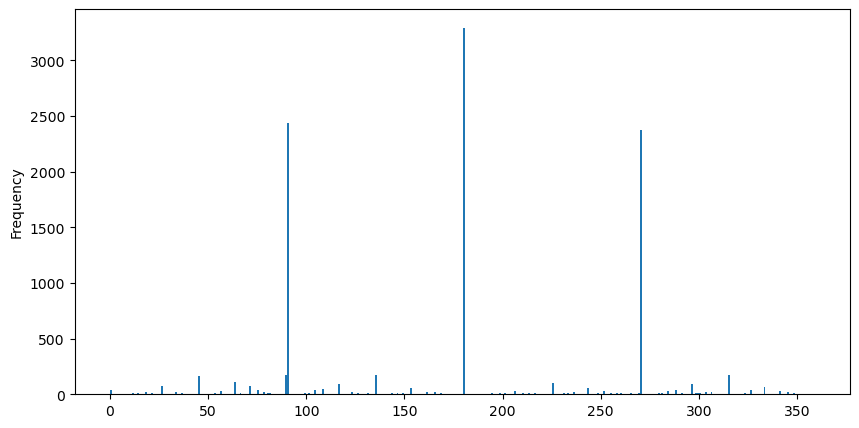

In [24]:
(rdics['india'])['direction'].plot.hist(bins=np.arange(0,360,1))

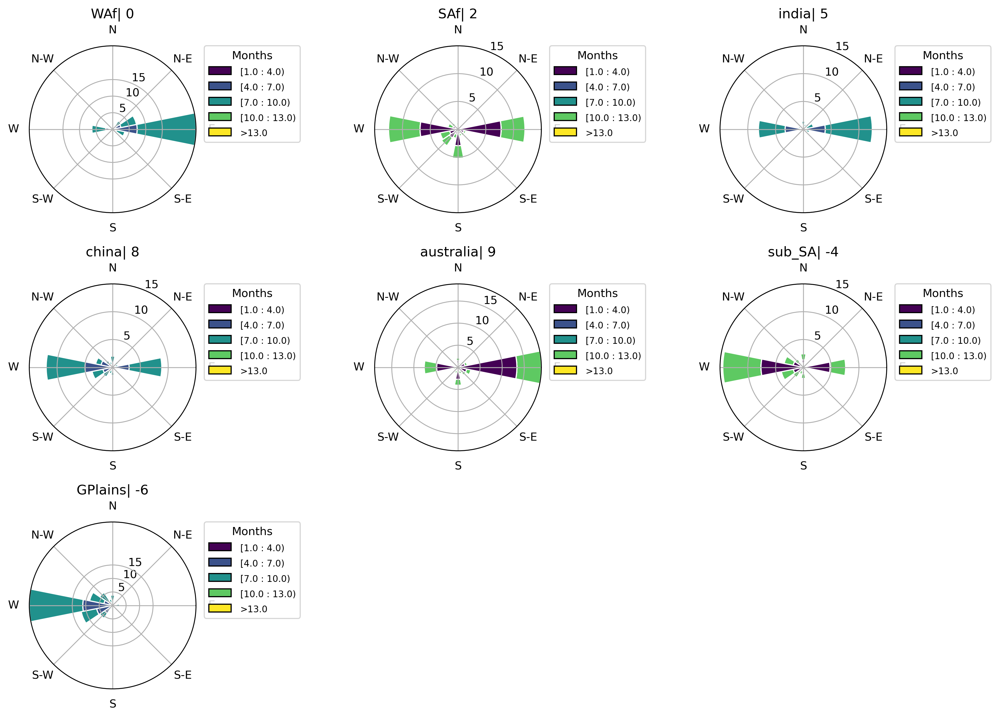

In [73]:
MREGIONS = {'WAf' : [[-18,25,4,25], 'spac', 0, (1,7), (5,9), (1,12)], # last is hourly offset to UCT # 12    # [-18,25,4,25]
 'SAf' : [[20,35, -35,-15], 'spac', 2, (9,12), (11,3), (11,3)], # 10
 'india' : [[70,90, 5,30], 'asia', 5, (1,7), (5,9), (1,12)], # 7
 'china' : [[105,115,25,40], 'asia', 8 , (1,7), (5,9), (1,12)], # 4
 'australia' : [[120,140,-23, -11], 'asia', 9, (11,3), (1,5), (1,12)], # 3
 'sub_SA' : [[-68,-47, -40, -20.5], 'spac', -4, (11,3), (1,5), (1,12)] , # 16
# 'trop_SA' : [[-75, -50, -20, -5], 'spac', -5, (1,12), (1,12), (1,12)], # 17
 'GPlains' : [[-100,-90,32,47], 'nam', -6, (1,7), (5,9), (1,12)] # # 18

}

f= plt.figure(figsize=(13,9), dpi=300)
maxval = [45,30,25,40,30,35,40]

for ids, regs in enumerate(MREGIONS.keys()):
    ax = f.add_subplot(3,3,ids+1,  projection='windrose')
    
    pick = (rdics[regs])
    #pick = pick[(pick['utc_month']>=11) | (pick['utc_month']<=2)]

    umean = (pick['movement_distance_x'])
    vmean = (pick['movement_distance_y'])
    
    ws, avg_wd = u_met.u_v_to_ws_wd(umean,vmean)
    
    direct = avg_wd
    
    #####################
    ws_array2 = pick['utc_month']  #np.array(wsin.flatten())
    wd_array2 = direct

    ax = WindroseAxes.from_ax(ax)
    ax.bar(wd_array2, ws_array2, normed=True, opening=1.0, edgecolor='white', bins=[1,4,7,10,13])  #, colors=color_s[0:5]
    ax.set_yticks(np.arange(5, 20, step=5))
    ax.set_yticklabels(np.arange(5, 20, step=5))



    ax.set_title(regs + '| '+str((MREGIONS[regs])[2]))
    ax.set_legend(title = 'Months', bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
#f.savefig('/home/ck/Desktop/lmcs/seasonal_cycle_storm_mint_dist.jpg')

plt.tight_layout()
#f.savefig('/home/ck/DIR/cornkle/figs/LMCS/storm_direction_windrose_datasetV2.jpg')

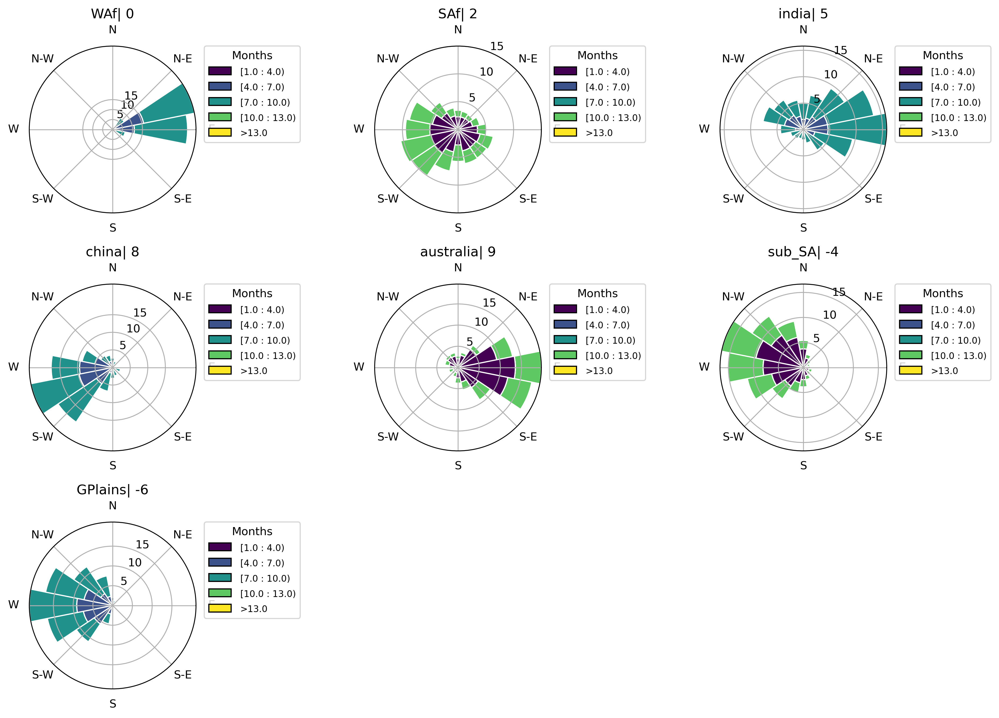

In [74]:
MREGIONS = {'WAf' : [[-18,25,4,25], 'spac', 0, (1,7), (5,9), (1,12)], # last is hourly offset to UCT # 12    # [-18,25,4,25]
 'SAf' : [[20,35, -35,-15], 'spac', 2, (9,12), (11,3), (11,3)], # 10
 'india' : [[70,90, 5,30], 'asia', 5, (1,7), (5,9), (1,12)], # 7
 'china' : [[105,115,25,40], 'asia', 8 , (1,7), (5,9), (1,12)], # 4
 'australia' : [[120,140,-23, -11], 'asia', 9, (11,3), (1,5), (1,12)], # 3
 'sub_SA' : [[-68,-47, -40, -20.5], 'spac', -4, (11,3), (1,5), (1,12)] , # 16
# 'trop_SA' : [[-75, -50, -20, -5], 'spac', -5, (1,12), (1,12), (1,12)], # 17
 'GPlains' : [[-100,-90,32,47], 'nam', -6, (1,7), (5,9), (1,12)] # # 18

}

f= plt.figure(figsize=(13,9), dpi=300)
maxval = [45,30,25,40,30,35,40]

for ids, regs in enumerate(MREGIONS.keys()):
    ax = f.add_subplot(3,3,ids+1,  projection='windrose')
    
    pick = (rdics[regs])
    #pick = pick[(pick['utc_month']>=11) | (pick['utc_month']<=2)]

    umean = (pick['ushear100m_650'])
    vmean = (pick['vshear100m_650'])
    
    ws, avg_wd = u_met.u_v_to_ws_wd(umean,vmean)
    
    direct = avg_wd
    
    #####################
    ws_array2 = pick['utc_month']  #np.array(wsin.flatten())
    wd_array2 = direct

    ax = WindroseAxes.from_ax(ax)
    ax.bar(wd_array2, ws_array2, normed=True, opening=1.0, edgecolor='white', bins=[1,4,7,10,13])  #, colors=color_s[0:5]
    ax.set_yticks(np.arange(5, 20, step=5))
    ax.set_yticklabels(np.arange(5, 20, step=5))



    ax.set_title(regs + '| '+str((MREGIONS[regs])[2]))
    ax.set_legend(title = 'Months', bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
#f.savefig('/home/ck/Desktop/lmcs/seasonal_cycle_storm_mint_dist.jpg')

plt.tight_layout()
#f.savefig('/home/ck/DIR/cornkle/figs/LMCS/storm_direction_windrose_datasetV2.jpg')

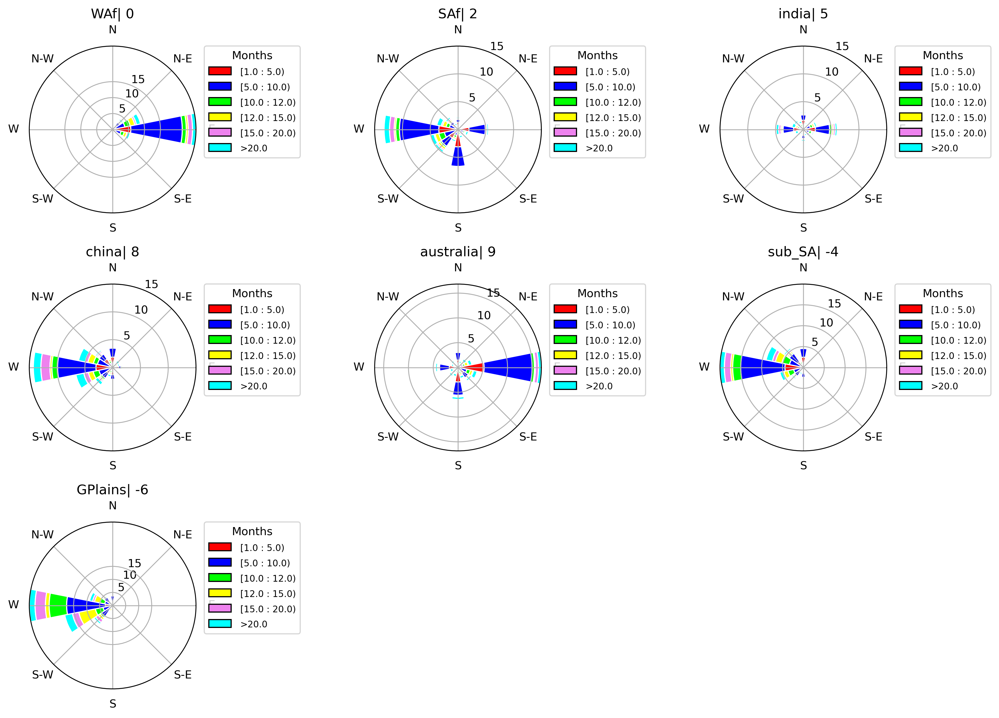

In [26]:
f= plt.figure(figsize=(13,9), dpi=300)
maxval = [45,30,25,40,30,35,40]

for ids, regs in enumerate(MREGIONS.keys()):
    ax = f.add_subplot(3,3,ids+1,  projection='windrose')
    
    pick = (rdics[regs])
    #pick = pick[(pick['utc_month']>=11) | (pick['utc_month']<=2)]

    umean = (pick['movement_distance_x'])
    vmean = (pick['movement_distance_y'])
    
    ws, avg_wd = u_met.u_v_to_ws_wd(umean,vmean)
    
    direct = avg_wd
    
    #####################
    ws_array2 = ws * 1000 / 60 / 60 #np.array(wsin.flatten())
    wd_array2 = direct

    ax = WindroseAxes.from_ax(ax)
    ax.bar(wd_array2, ws_array2, normed=True, opening=1.0, edgecolor='white', bins=[1,5,10,12,15,20], colors=color_s[0:6])
    ax.set_yticks(np.arange(5, 20, step=5))
    ax.set_yticklabels(np.arange(5, 20, step=5))



    ax.set_title(regs + '| '+str((MREGIONS[regs])[2]))
    ax.set_legend(title = 'Months', bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
#f.savefig('/home/ck/Desktop/lmcs/seasonal_cycle_storm_mint_dist.jpg')

plt.tight_layout()
#f.savefig('/home/ck/Desktop/lmcs/storm_direction_windrose.jpg')

/home/ck/miniconda3/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1555: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)


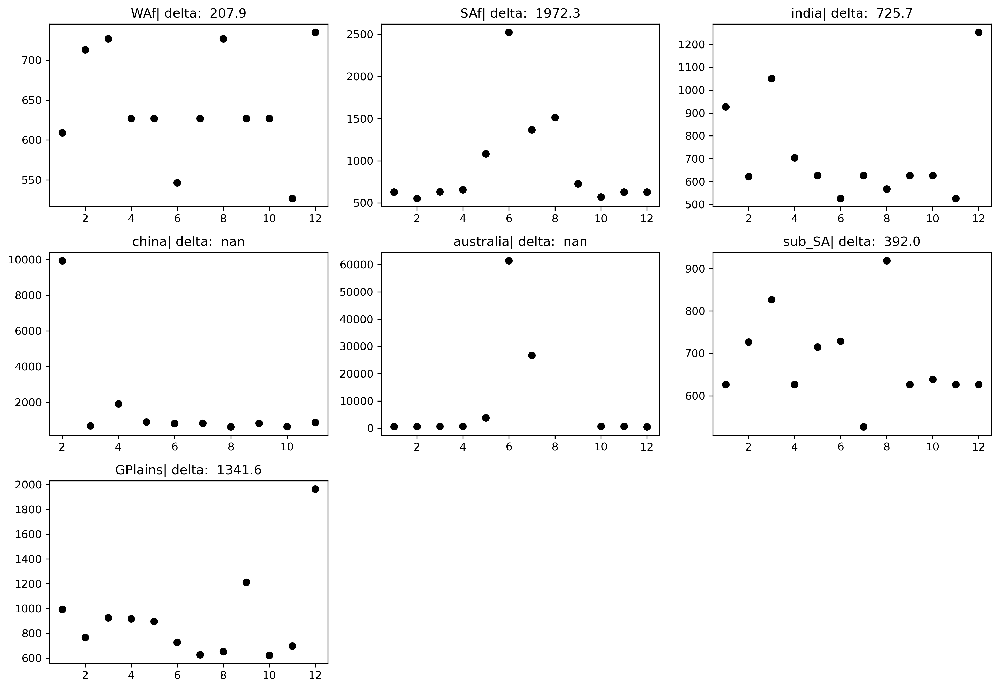

In [53]:
f= plt.figure(figsize=(13,9), dpi=300)
for ids, regs in enumerate(MREGIONS.keys()):
    

    ax = f.add_subplot(3,3,ids+1)
    
    pick = rdics[regs]
    coll = []
    for m in range(1,13):
        pickm = pick[pick['utc_month'] == m]
        meant =  np.nanpercentile(pickm['pf_area1'].values, 0.99)
        coll.append(meant)
     
        
    ax.scatter(range(1,13),np.array(coll)-273.15, color='k')
    ax.set_title(regs + '| delta:  '+str(np.round(np.array(coll).max()-np.array(coll).min(),1)))
plt.tight_layout()
#f.savefig('/home/ck/Desktop/lmcs/seasonal_cycle_storm_area.jpg')

In [ ]:
f= plt.figure(figsize=(13,9), dpi=300)
for ids, regs in enumerate(MREGIONS.keys()):
    

    ax = f.add_subplot(3,3,ids+1)
    
    pick = rdics[regs]
    coll = []
    for m in range(1,13):
        pickm = pick[pick['month'] == m]
        meant =  pickm['meantb'].mean()
        coll.append(meant)
     
        
    ax.scatter(range(1,13),np.array(coll)-273.15, color='k')
    ax.set_title(regs + '| delta:  '+str(np.round(np.array(coll).max()-np.array(coll).min(),1)))
plt.tight_layout()
#f.savefig('/home/ck/Desktop/lmcs/seasonal_cycle_storm_meant.jpg')

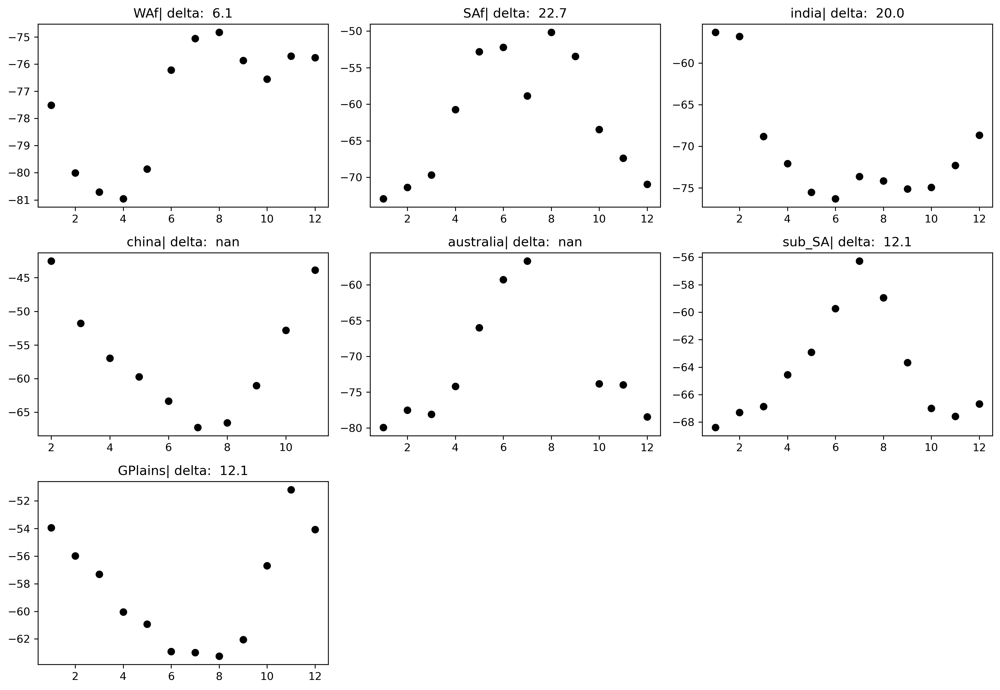

In [54]:
f= plt.figure(figsize=(13,9), dpi=300)
for ids, regs in enumerate(MREGIONS.keys()):
    

    ax = f.add_subplot(3,3,ids+1)
    
    pick = rdics[regs]
    coll = []
    for m in range(1,13):
        pickm = pick[pick['utc_month'] == m]
        meant =  pickm['corecold_mintb'].mean()
        coll.append(meant)
     
        
    ax.scatter(range(1,13),np.array(coll)-273.15, color='k')
    ax.set_title(regs + '| delta:  '+str(np.round(np.array(coll).max()-np.array(coll).min(),1)))
plt.tight_layout()
#f.savefig('/home/ck/Desktop/lmcs/seasonal_cycle_storm_mint.jpg')

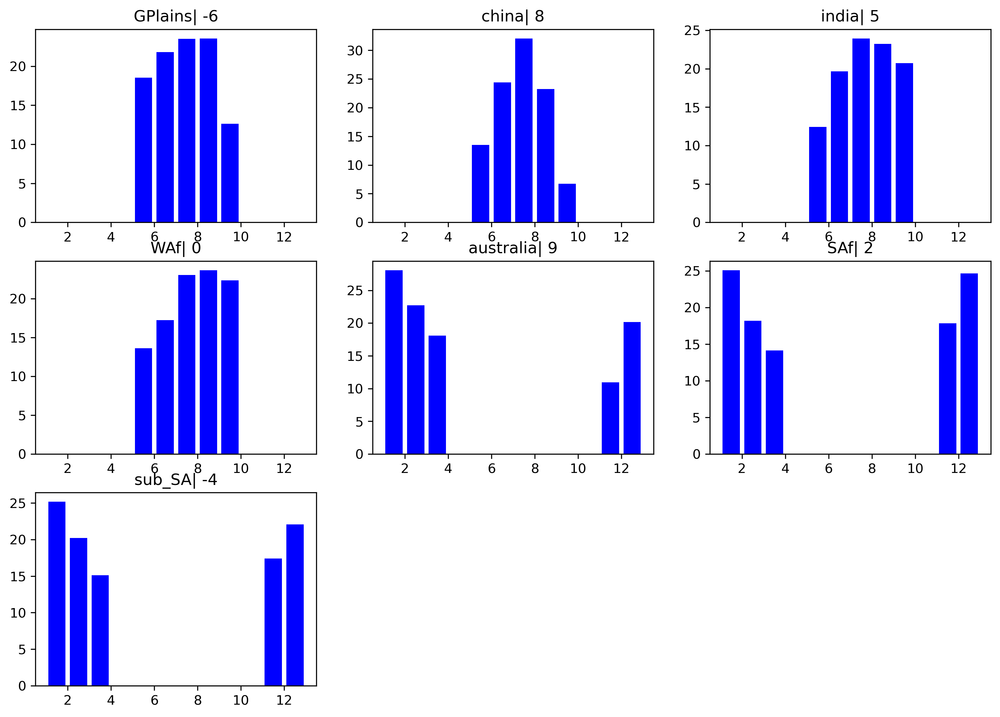

In [70]:
f= plt.figure(figsize=(13,9), dpi=300)
for ids, regs in enumerate(MREGIONS.keys()):
    ax = f.add_subplot(3,3,ids+1)
    
    pick = rdics[regs]
    hist_freq, hist_count, bin_edge = u_stats.histo_frequency(pick['utc_month'], bins=np.arange(1,14))
    #print(np.unique(pick['hour']))
    mid_bin = bin_edge[0:-1] + (bin_edge[1::]-bin_edge[0:-1])/2
    #m_bin = mid_bin - (MREGIONS[regs])[2]
    #print(mid_bin)
    colors = ['b']*24
#     ispos = int(np.where(mid_bin==18.5)[0])
#     secpos = int(np.where(mid_bin==13.5)[0])
#     firstpos = int(np.where(mid_bin==10.5)[0])
#     #minpos = ispos-(MREGIONS[regs])[2]
#     #ipdb.set_trace()
#     minpos = ispos-(MREGIONS[regs])[2]
#     miinpos = firstpos - (MREGIONS[regs])[2]
#     miiinpos = secpos - (MREGIONS[regs])[2]
#     print(minpos)
#     if minpos == 24:
#         minpos=0
    
#     colors[minpos] = 'r'
#     colors[miinpos] = 'turquoise'
#     colors[miiinpos] = 'purple'
    ax.bar(mid_bin,hist_freq, align='center', color=colors)
    ax.set_title(regs + '| '+str((MREGIONS[regs])[2]))
#f.savefig('/home/ck/Desktop/lmcs/seasonal_cycle_stormNB.jpg')

18
16
13
10
9
22
24


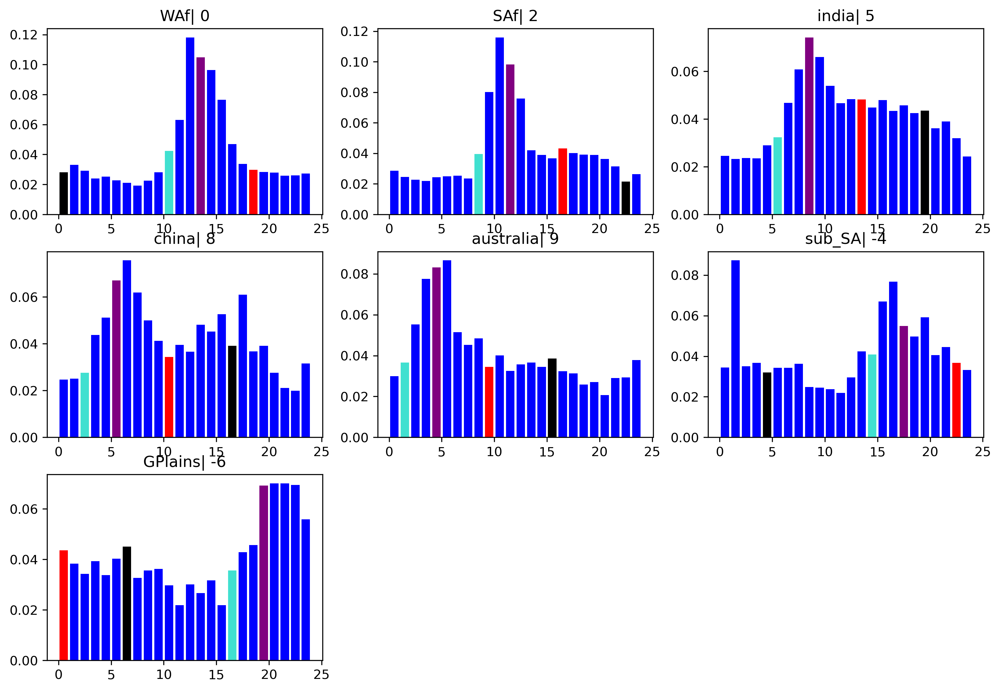

In [14]:
f= plt.figure(figsize=(13,9), dpi=300)
for ids, regs in enumerate(MREGIONS.keys()):
    ax = f.add_subplot(3,3,ids+1)
    
    pick = rdics[regs]
    hist_freq, hist_count, bin_edge = u_stats.histo_frequency(pick['init_hour'], bins=np.arange(0,25))
    #print(np.unique(pick['hour']))
    mid_bin = bin_edge[0:-1] + (bin_edge[1::]-bin_edge[0:-1])/2
    #m_bin = mid_bin - (MREGIONS[regs])[2]
    #print(mid_bin)
    colors = ['b']*24
    ispos = int(np.where(mid_bin==18.5)[0])
    secpos = int(np.where(mid_bin==13.5)[0])
    firstpos = int(np.where(mid_bin==10.5)[0])
    thirdpos = int(np.where(mid_bin==0.5)[0])
    #minpos = ispos-(MREGIONS[regs])[2]
    #ipdb.set_trace()
    minpos = ispos-(MREGIONS[regs])[2]
    miinpos = firstpos - (MREGIONS[regs])[2]
    miiinpos = secpos - (MREGIONS[regs])[2]
    midnightpos = thirdpos - (MREGIONS[regs])[2]
    print(minpos)
    if minpos == 24:
        minpos=0
    
    colors[minpos] = 'r'
    colors[miinpos] = 'turquoise'
    colors[miiinpos] = 'purple'
    colors[midnightpos] = 'k'
    ax.bar(mid_bin,hist_freq, align='center', color=colors)
    ax.set_title(regs + '| '+str((MREGIONS[regs])[2]))


In [107]:
def create_dic(dic):
    
    tt = np.array(dic['tmin'])
    mask = np.where(tt<=-50)
    
    pp = np.array(dic['pmax'])[mask] 
    sh = np.array(dic['shear'])[mask]  # 925-650 hPa shear
    umin = np.array(dic['u650'])[mask] # minimum 650hPa zonal wind 
    umax = np.array(dic['u925'])[mask] # maximum 925hPa zonal wind
    qq = np.array(dic['q925'])[mask]   # 925hPa spec humidity
    qup = np.array(dic['q650'])[mask]  # 650hPa spec humidity
    tlow = np.array(dic['t925'])[mask] # 925hPa temperature
    tt = np.array(dic['tmin'])[mask]   # minimum cloud top temperature
    ttm = np.array(dic['tmean'])[mask] # mean cloud top temperature
    month = np.array(dic['month'])[mask] 
    hour = np.array(dic['hour'])[mask]
    year = np.array(dic['year'])[mask]
   # minute = np.array(dic['minute'])[mask]
    day = np.array(dic['day'])[mask]
    date = np.array(dic['date'])[mask]
    area = np.array(dic['area'])[mask] # -50C storm area
    lat = np.array(dic['clat'])[mask] # location of minimum temperature
    lon = np.array(dic['clon'])[mask] # location of minimum temperature
    tcwv = np.array(dic['tcwv'])[mask] # total column water vapour
    rh = np.array(dic['rh925'])[mask] # 925hPa relative humidity
    #pall = np.array(dic['p'])[mask] # precipitation field within -50C cloud area


    obs_pcp = {
        'prcp' : pp,
        'q925' : qq*1000,
        'q650' : qup*1000,
        't925' : tlow-273.15,
        'shear' : sh*-1,
        'month' : month,    
        'hour' : hour,
        'year' : year,
      #  'minute' : minute,
        'day' : day,
        'date' : date,
        'area' : (area)*(5**2),
        'tmin' : tt,
        'rh' : rh,
        'tcwv' : tcwv,
        'lat' : lat,
        'lon' : lon,
        #'pall' : pall
    } 
    
    obs = pd.DataFrame(obs_pcp)
    return obs



file_path = cnst.CLOVER_SAVES + 'bulk_-50_5000km2_GPM_5-10N_10W10E_p15_ERA0.7_fullYear*.p'
ds = glob.glob(file_path)

for ids, dss in enumerate(ds):
    data = pkl.load( open (dss, 'rb'))

    obs_gpmf_h = create_dic(data)
    if ids > 0:
        obs_gpmf = pd.concat([obs_gpmf, obs_gpmf_h])
    else:
        obs_gpmf = obs_gpmf_h

    del data
obs = obs_gpmf[obs_gpmf.prcp>5]
obs = pd.DataFrame(obs)

In [113]:
obs

,prcp,q925,q650,t925,shear,month,hour,year,day,date,area,tmin,rh,tcwv,lat,lon
0,7.657979,14.724190,4.140953,25.701318,6.841075,1,17,2007,28,2007-01-28 17:30:00,6325,-75.300844,65.575134,38.754639,7.356987,-1.882976
2,15.055140,14.724190,4.140953,25.701318,6.841075,1,18,2007,28,2007-01-28 18:30:00,11500,-69.499090,65.575134,38.754639,7.404227,-2.109662
3,5.943133,15.173133,4.058833,25.401636,5.112180,1,17,2007,29,2007-01-29 17:30:00,5975,-72.302664,68.002640,40.713509,6.358965,-0.271936
4,36.356035,16.458932,5.158984,23.484399,10.712464,1,17,2007,29,2007-01-29 17:30:00,9325,-63.217142,84.037170,44.086544,7.397655,-7.537494
5,7.684593,16.889343,4.339702,21.651758,11.828568,1,16,2007,31,2007-01-31 16:00:00,12050,-78.338737,96.645584,51.395821,5.408220,-7.923906
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2672,12.618616,17.474011,4.316392,22.397241,9.893822,12,17,2008,17,2008-12-17 17:00:00,5650,-81.180647,95.546036,48.703316,5.587612,7.445095
2673,12.350243,16.071051,4.687850,23.121545,9.465675,12,17,2008,17,2008-12-17 17:00:00,5350,-76.991820,83.916214,48.527660,6.088415,-0.980034
2674,44.925868,16.082516,6.127825,20.624200,7.371384,12,17,2008,18,2008-12-18 17:00:00,55575,-83.975624,96.535057,52.119255,5.832236,-7.297491
2675,43.569980,16.232213,5.767504,22.369257,8.320564,12,17,2008,18,2008-12-18 17:00:00,13200,-77.568508,88.686577,53.128746,5.710372,-4.322611


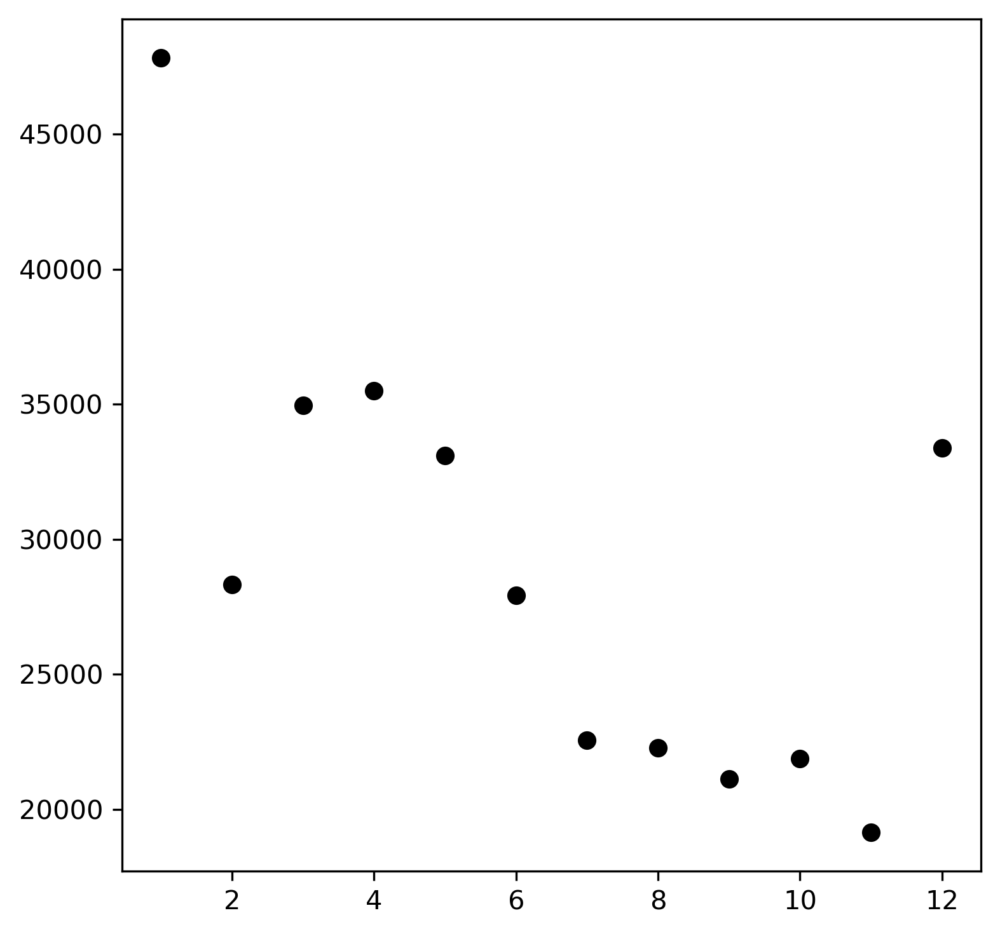

In [115]:
f= plt.figure(figsize=(10,5), dpi=300)

ax = f.add_subplot(1,2,1)
    
pick =obs
coll = []
for m in range(1,13):
    pickm = pick[pick['month'] == m]
    meant =  pickm['area'].mean()
    coll.append(meant)


ax.scatter(range(1,13),np.array(coll), color='k')
#ax.set_title(regs + '| delta:  '+str(np.round(np.array(coll).max()-np.array(coll).min(),1)))
plt.tight_layout()
#f.savefig('/home/ck/Desktop/lmcs/seasonal_cycle_storm_mint.jpg')

Text(0.5, 1.0, 'Storm area West Africa | 5000km2 min, -50C')

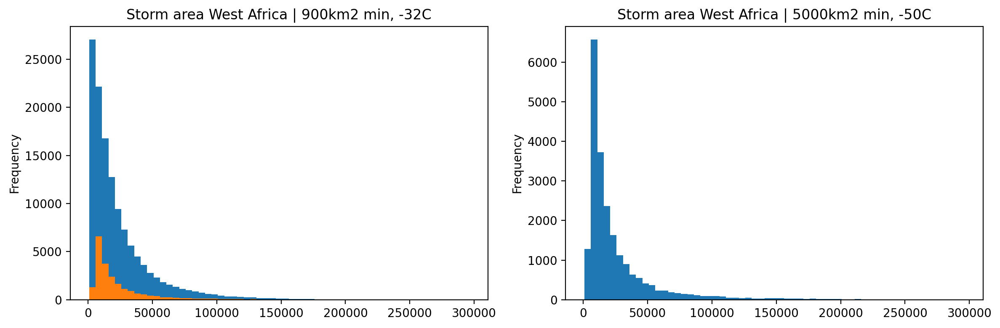

In [125]:
f = plt.figure(figsize=(12,4), dpi=200)
ax = f.add_subplot(121)
(rdics['WAf'])['pf_area1'].plot.hist(bins=range(900,300000,5000)) # ccs_area, pf_area1
plt.title('Storm area West Africa | 900km2 min, -32C')

ax = f.add_subplot(122)
(obs['area']).plot.hist(bins=range(900,300000,5000))
plt.tight_layout()
plt.title('Storm area West Africa | 5000km2 min, -50C')

Text(0.5, 1.0, 'Storm area West Africa | 5000km2 min, -50C')

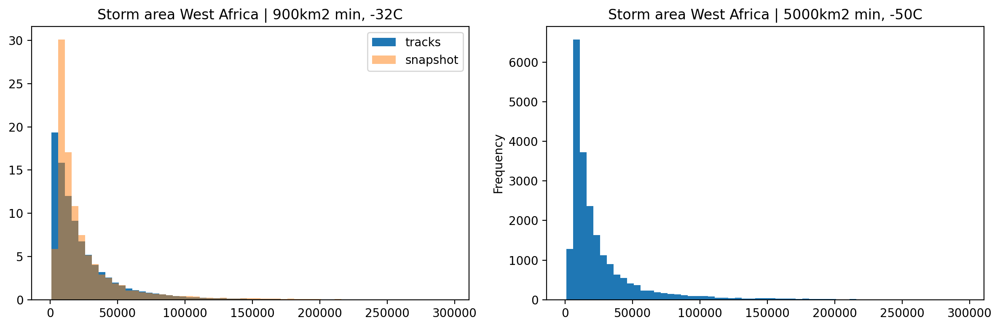

In [138]:
from utils import u_plot
f = plt.figure(figsize=(12,4), dpi=200)
ax = f.add_subplot(121)
#hist, count, h = stats.histo_frequency((rdics['WAf'])['pf_area1'], bins=range(900,300000,5000))
u_plot.hist_freq(ax, rdics['WAf']['pf_area1'], bins=range(900,300000,5000), label='tracks') # ccs_area, pf_area1
u_plot.hist_freq(ax, obs['area'], bins=range(900,300000,5000), label='snapshot', alpha=0.5) # ccs_area, pf_area1
plt.title('Storm area West Africa | 900km2 min, -32C')
#ax.set_xlim(10000,200000)
plt.legend()

ax = f.add_subplot(122)
(obs['area']).plot.hist(bins=range(900,300000,5000))
plt.tight_layout()
plt.title('Storm area West Africa | 5000km2 min, -50C')